# Análisis Exploratorio de Datos: Tarifas de Combustibles de Costa Rica

## Integrantes del Equipo
- Oscar Lara
- Deivy Cerda

## Modelado Seleccionado
**Tipo de modelo:** Árbol de Regresión Múltiple

**Justificación:**
Se escoge el modelo de árbol de regresión múltiple debido a que nuestro conjunto de datos está compuesto principalmente por variables numéricas y buscamos una predicción con alto porcentaje de acierto. Este tipo de modelado se adapta mejor a nuestras necesidades porque:
- Maneja eficientemente conjuntos de datos con múltiples variables numéricas continuas
- Puede capturar relaciones complejas no lineales entre variables predictoras y el precio final
- No requiere transformaciones previas de los datos ya estandarizados
- Ofrece mayor precisión que la regresión lineal al segmentar los datos en grupos homogéneos
- Proporciona información clara sobre la importancia de cada variable en la predicción

**Variable dependiente:** Precio final en estaciones de servicio

**Variables independientes principales:**
- Precio Referencia Internacional
- Tipo de Cambio
- Impuesto Único
- Margen de operación de Recope
- Márgenes de distribución
- Subsidios aplicados
- Producto (codificado)

## Fuente de Datos
Autoridad Reguladora de Servicios Públicos (ARESEP) - Tarifas de combustibles de Costa Rica

In [54]:
# Instalar librerías necesarias
!pip install pandas numpy matplotlib seaborn scikit-learn scipy plotly category_encoders


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from functools import lru_cache  # Añadido para mejorar rendimiento
import datetime
import re
import os
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import category_encoders as ce
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Configuración para visualización - configurado una sola vez
plt.style.use("ggplot")
plt.rcParams["figure.figsize"] = (12, 6)
sns.set()

# Mostrar todas las columnas
pd.set_option("display.max_columns", None)

In [56]:
@lru_cache(maxsize=1)  # Cachear la carga de datos para no repetir
def cargar_datos(url):
    """Carga el dataset desde la URL especificada con caché."""
    return pd.read_csv(url)

# URL del dataset
URL_DATASET = "https://raw.githubusercontent.com/LSCAR23/ARESEP-gas-data-set/main/Datos_Abiertos_ARESEP_Tarifas_de_combustibles_de_Costa_Rica.csv"

# Cargar datos
df = cargar_datos(URL_DATASET)

## Visualización de las principales características del conjunto de datos

In [57]:
def analisis_exploratorio(dataframe, verbose=True):
    """
    Realiza un análisis exploratorio completo del DataFrame.
    
    Args:
        dataframe: DataFrame de pandas
        verbose: Si True, imprime los resultados. Si False, solo retorna los resultados.
    
    Returns:
        dict: Diccionario con los resultados del análisis
    """
    resultados = {}
    
    # Dimensiones
    dimensiones = {"filas": dataframe.shape[0], "columnas": dataframe.shape[1]}
    resultados["dimensiones"] = dimensiones
    
    # Análisis de valores nulos (calculado una sola vez)
    nulos = dataframe.isnull().sum()
    porcentaje_nulos = (nulos / len(dataframe)) * 100
    info_nulos = pd.DataFrame({"Nulos": nulos, "Porcentaje (%)": porcentaje_nulos})
    resultados["info_nulos"] = info_nulos
    
    # Columnas por tipo de datos
    tipos_datos = dataframe.dtypes
    resultados["tipos_datos"] = tipos_datos
    
    # Columnas categóricas y numéricas (calculadas una sola vez)
    cols_categoricas = dataframe.select_dtypes(include=["object", "category"]).columns.tolist()
    cols_numericas = dataframe.select_dtypes(include=["float64", "int64"]).columns.tolist()
    resultados["cols_categoricas"] = cols_categoricas
    resultados["cols_numericas"] = cols_numericas
    
    # Información de valores únicos en columnas categóricas
    valores_unicos = {col: dataframe[col].nunique() for col in cols_categoricas}
    resultados["valores_unicos"] = valores_unicos
    
    # Estadísticas descriptivas (calculadas directamente sin intermediarios)
    resultados["estadisticas"] = dataframe.describe()
    
    # Imprimir resultados si verbose es True
    if verbose:
        print("Dimensiones del dataset:")
        print(f"- Filas: {dimensiones['filas']}")
        print(f"- Columnas: {dimensiones['columnas']}")
        
        print("\nTipos de datos:")
        print(tipos_datos)
        
        print("\nValores nulos por columna:")
        nulos_filtrados = info_nulos[info_nulos["Nulos"] > 0].sort_values("Porcentaje (%)", ascending=False)
        print(nulos_filtrados)
        
        print("\nEstadísticas descriptivas de columnas numéricas:")
        print(resultados["estadisticas"])
        
        print("\nValores únicos en columnas categóricas:")
        for col, count in valores_unicos.items():
            print(f"- {col}: {count} valores únicos")
    
    return resultados

# Ejecutar análisis exploratorio
resultado_analisis = analisis_exploratorio(df)

Dimensiones del dataset:
- Filas: 7353
- Columnas: 50

Tipos de datos:
Expediente                                             object
Número resolución                                      object
Fecha Publicación                                      object
Alcance Gaceta                                         object
Gaceta                                                  int64
Producto                                               object
Tipo de Cambio                                        float64
Precio Referencia Internacional                       float64
Precio Referencia Internacional en colones            float64
Costo adquisión dólar por barril                      float64
Costo adquisión en colones por litro                  float64
Otros Ingresos Prorrateados                           float64
Asignación Subsidio Pescadores                        float64
Asignación subsidio Política Sectorial                float64
Asignación subsidio Políticas del Gobierno            float64

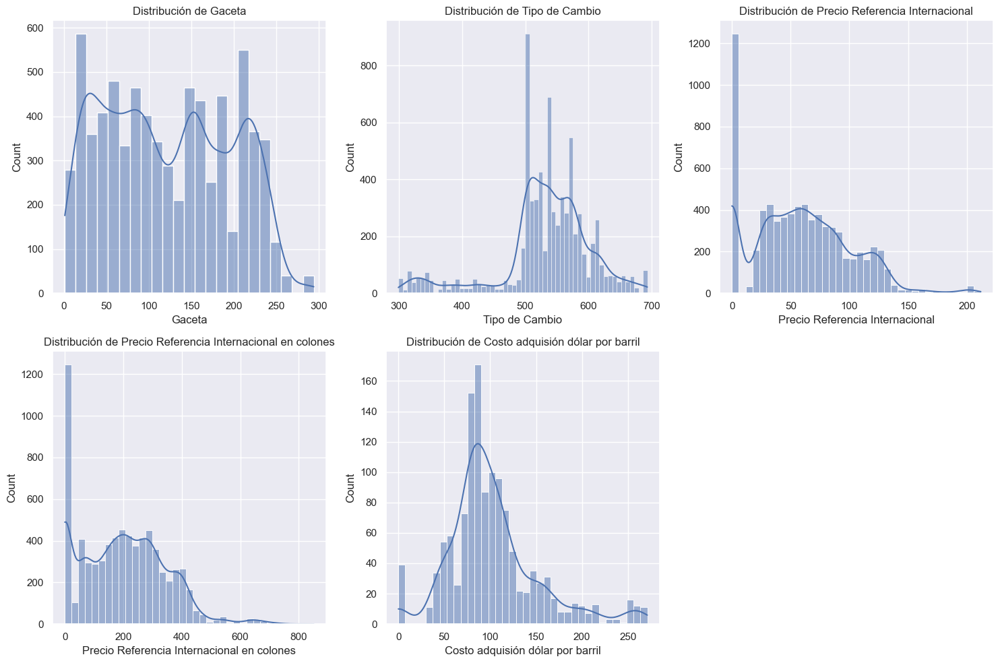

C:\Users\larao\AppData\Local\Temp\ipykernel_6988\3651965147.py:71: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



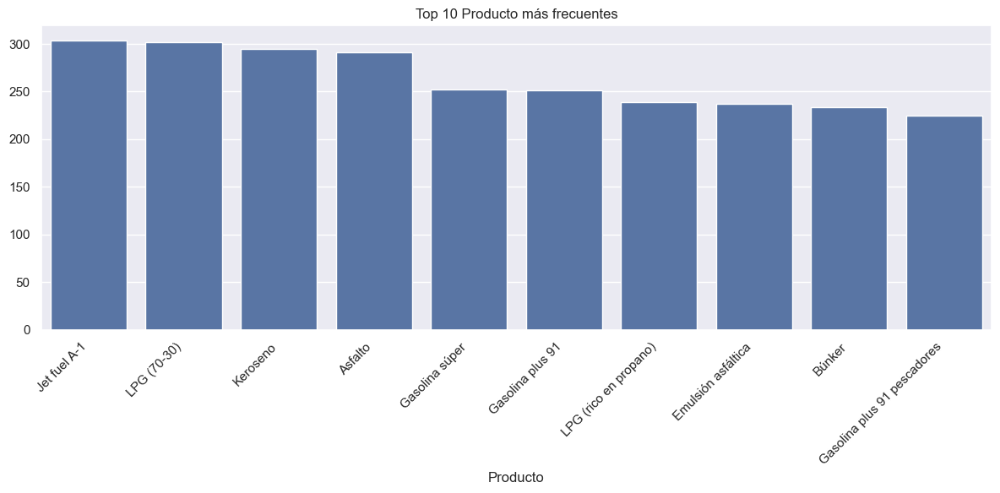

In [58]:
def visualizar_datos_numericos(dataframe, columnas=None, max_graficos=5, plot=True):
    """
    Visualiza la distribución de columnas numéricas.
    
    Args:
        dataframe: DataFrame de pandas
        columnas: Lista de columnas a visualizar. Si es None, se seleccionan automáticamente.
        max_graficos: Número máximo de gráficos a mostrar
        plot: Si True, muestra los gráficos. Si False, solo prepara la figura.
    
    Returns:
        fig: Figura de matplotlib
    """
    # Si no se especifican columnas, usar las primeras columnas numéricas
    if columnas is None:
        columnas = dataframe.select_dtypes(include=["float64", "int64"]).columns[:max_graficos]
    else:
        # Limitar a max_graficos
        columnas = columnas[:max_graficos]
    
    # Calcular número de filas y columnas para los subplots
    n_cols = min(3, len(columnas))
    n_rows = (len(columnas) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = np.array(axes).flatten()  # Asegurar que axes sea un array plano
    
    for i, col in enumerate(columnas):
        if i < len(axes):  # Prevenir IndexError
            # Usar valores no nulos directamente
            valid_data = dataframe[col].dropna()
            if len(valid_data) > 0:  # Verificar que haya datos
                sns.histplot(valid_data, kde=True, ax=axes[i])
                axes[i].set_title(f"Distribución de {col}")
    
    # Ocultar ejes vacíos
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    
    if plot:
        plt.show()
    
    return fig

# Visualizar columnas numéricas
fig_numericas = visualizar_datos_numericos(df)

# Visualizar productos más frecuentes
def visualizar_categorias_frecuentes(dataframe, columna, top_n=10, plot=True):
    """
    Visualiza las categorías más frecuentes de una columna.
    
    Args:
        dataframe: DataFrame de pandas
        columna: Nombre de la columna categórica
        top_n: Número de categorías top a mostrar
        plot: Si True, muestra el gráfico. Si False, solo prepara la figura.
    
    Returns:
        fig, ax: Figura y ejes de matplotlib
    """
    if columna in dataframe.columns:
        # Calcular las frecuencias una sola vez
        categorias_frecuentes = dataframe[columna].value_counts().head(top_n)
        
        fig, ax = plt.subplots(figsize=(12, 6))
        sns.barplot(x=categorias_frecuentes.index, y=categorias_frecuentes.values, ax=ax)
        ax.set_title(f"Top {top_n} {columna} más frecuentes")
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
        plt.tight_layout()
        
        if plot:
            plt.show()
        
        return fig, ax
    
    return None, None

# Visualizar productos si existe la columna
if "Producto" in df.columns:
    fig_productos, ax_productos = visualizar_categorias_frecuentes(df, "Producto")


## Visualización de valores nulos y atípicos

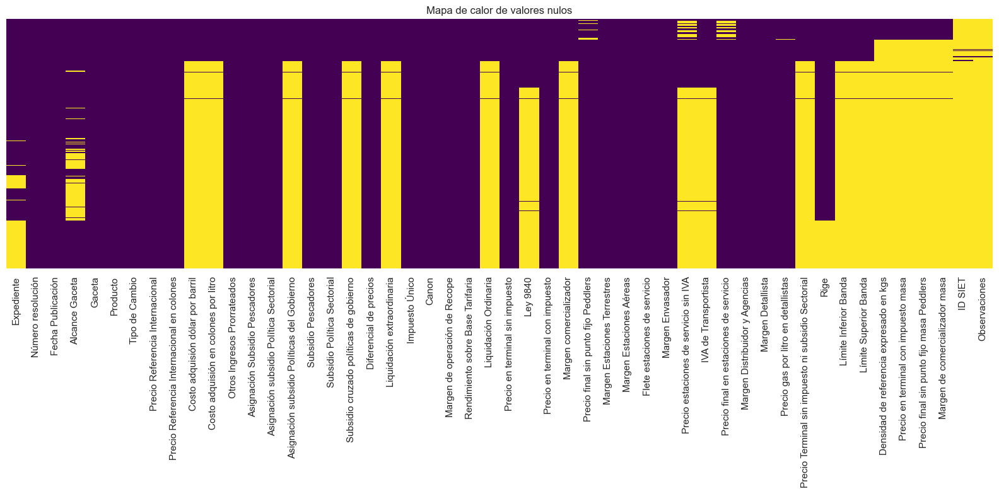


Relación entre valores nulos en diferentes columnas:
Esto puede ayudar a identificar si los valores nulos siguen algún patrón


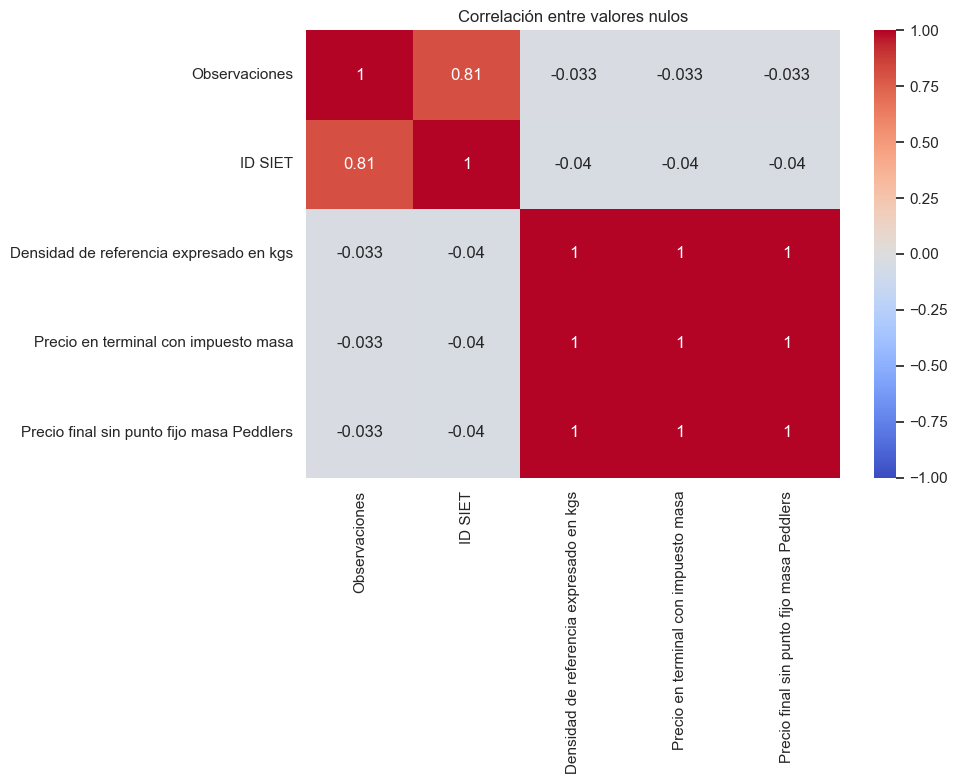

In [59]:
def visualizar_valores_nulos(dataframe, info_nulos=None, plot=True):
    """
    Visualiza los valores nulos en el DataFrame de varias formas.
    
    Args:
        dataframe: DataFrame de pandas
        info_nulos: DataFrame con información de nulos (opcional)
        plot: Si True, muestra los gráficos. Si False, solo prepara las figuras.
    
    Returns:
        tuple: Tupla con figuras generadas
    """
    figuras = []
    
    # Mapa de calor de valores nulos
    plt.figure(figsize=(16, 8))
    ax = sns.heatmap(dataframe.isnull(), cmap='viridis', yticklabels=False, cbar=False)
    plt.title('Mapa de calor de valores nulos')
    plt.tight_layout()
    figuras.append(plt.gcf())
    
    if plot:
        plt.show()
    
    # Si no se proporciona info_nulos, calcularlo
    if info_nulos is None:
        nulos = dataframe.isnull().sum()
        porcentaje_nulos = (nulos / len(dataframe)) * 100
        info_nulos = pd.DataFrame({"Nulos": nulos, "Porcentaje (%)": porcentaje_nulos})
    
    # Visualización de columnas con valores nulos
    cols_with_nulls = info_nulos[info_nulos["Nulos"] > 0].sort_values("Porcentaje (%)", ascending=True)
    
    if not cols_with_nulls.empty:
        # Gráfico de barras con plotly
        fig_bar = px.bar(cols_with_nulls, 
                         x=cols_with_nulls.index, 
                         y="Porcentaje (%)",
                         title="Porcentaje de valores nulos por columna",
                         labels={"index": "Columnas", "Porcentaje (%)": "Porcentaje de valores nulos"})
        fig_bar.update_layout(xaxis_tickangle=-45)
        
        if plot:
            fig_bar.show()
        
        figuras.append(fig_bar)
        
        # Análisis de correlación de valores nulos (solo si hay más de una columna con nulos)
        if len(cols_with_nulls) > 1:
            print("\nRelación entre valores nulos en diferentes columnas:")
            print("Esto puede ayudar a identificar si los valores nulos siguen algún patrón")
            
            # Seleccionar las columnas con más valores nulos (máximo 5)
            top_null_cols = cols_with_nulls.nlargest(min(5, len(cols_with_nulls)), "Nulos").index.tolist()
            
            # Calcular la matriz de correlación de valores nulos
            # La operación .isnull() solo se realiza una vez para las columnas seleccionadas
            null_vals = dataframe[top_null_cols].isnull()
            null_matrix = null_vals.corr()
            
            plt.figure(figsize=(10, 8))
            sns.heatmap(null_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
            plt.title('Correlación entre valores nulos')
            plt.tight_layout()
            figuras.append(plt.gcf())
            
            if plot:
                plt.show()
    
    return tuple(figuras)

# Usar la información de nulos ya calculada
figs_nulos = visualizar_valores_nulos(df, info_nulos=resultado_analisis["info_nulos"])

In [60]:
# Bloque 6: Eliminación de columnas (optimizado)
# @lru_cache(maxsize=1)
def identificar_columnas_a_eliminar(dataframe, umbral_nulos=45, cols_especificas=None):
    """
    Identifica columnas a eliminar basado en porcentaje de nulos y lista específica.
    
    Args:
        dataframe: DataFrame de pandas
        umbral_nulos: Porcentaje mínimo de nulos para eliminar una columna
        cols_especificas: Lista de columnas específicas a eliminar
    
    Returns:
        list: Lista de columnas a eliminar
    """
    # Calcular porcentaje de nulos una sola vez
    porcentaje_nulos = (dataframe.isnull().sum() / len(dataframe) * 100)
    
    # Identificar columnas con alto porcentaje de nulos
    cols_high_null = porcentaje_nulos[porcentaje_nulos > umbral_nulos].index.tolist()
    
    # Columnas específicas (si no se proporciona, usar lista vacía)
    cols_to_drop = cols_especificas if cols_especificas is not None else []
    
    # Combinar las listas y verificar que existan en el DataFrame
    all_cols_to_drop = list(set(cols_high_null + cols_to_drop))
    all_cols_to_drop = [col for col in all_cols_to_drop if col in dataframe.columns]
    
    # Crear un diccionario con las razones de eliminación
    razones = {}
    for col in all_cols_to_drop:
        if col in cols_high_null:
            razones[col] = f"{porcentaje_nulos[col]:.2f}% de valores nulos"
        else:
            razones[col] = "eliminada por especificación"
    
    return all_cols_to_drop, razones

def limpiar_dataframe(dataframe, umbral_nulos=45, cols_especificas=None, verbose=True):
    """
    Elimina columnas basadas en criterios y retorna un DataFrame limpio.
    
    Args:
        dataframe: DataFrame de pandas
        umbral_nulos: Porcentaje mínimo de nulos para eliminar una columna
        cols_especificas: Lista de columnas específicas a eliminar
        verbose: Si True, imprime información sobre el proceso
    
    Returns:
        pd.DataFrame: DataFrame limpio
    """
    if verbose:
        print("\n## Eliminación de columnas con alto porcentaje de nulos y columnas específicas")
        print("Realizando limpieza de columnas...")
    
    # Identificar columnas a eliminar (usando caché)
    cols_to_drop, razones = identificar_columnas_a_eliminar(
        dataframe, 
        umbral_nulos=umbral_nulos, 
        cols_especificas=cols_especificas
    )
    
    # Crear una copia eficiente del DataFrame
    if cols_to_drop:
        # Usar drop directamente sin crear copia completa si hay columnas a eliminar
        df_clean = dataframe.drop(columns=cols_to_drop)
        
        if verbose:
            print(f"\nColumnas eliminadas ({len(cols_to_drop)}):")
            for col, razon in razones.items():
                print(f"- {col}: {razon}")
            
            print(f"\nDimensiones del DataFrame:")
            print(f"- Original: {dataframe.shape}")
            print(f"- Después de eliminar columnas: {df_clean.shape}")
            
            # Mostrar primeras filas usando head directamente
            print("\nPrimeras filas del DataFrame limpio:")
            # Nota: aquí usaríamos display(df_clean.head()) en un entorno notebook
            # Para este código, simplemente imprimir las primeras filas
            print(df_clean.head())
    else:
        df_clean = dataframe.copy()
        if verbose:
            print("No se encontraron columnas que cumplan con los criterios de eliminación.")
    
    return df_clean

# Aplicar limpieza al DataFrame
cols_especificas = ['Expediente', 'Número resolución']
df_clean = limpiar_dataframe(df, umbral_nulos=45, cols_especificas=cols_especificas)

# Reemplazar DataFrame original con la versión limpia
df = df_clean


## Eliminación de columnas con alto porcentaje de nulos y columnas específicas
Realizando limpieza de columnas...

Columnas eliminadas (21):
- Ley 9840: 71.45% de valores nulos
- Costo adquisión dólar por barril: 82.51% de valores nulos
- Margen comercializador: 82.51% de valores nulos
- Número resolución: eliminada por especificación
- Precio final sin punto fijo masa Peddlers: 91.24% de valores nulos
- ID SIET: 98.34% de valores nulos
- Liquidación Ordinaria: 82.51% de valores nulos
- IVA de Transportista: 71.45% de valores nulos
- Liquidación extraordinaria: 82.51% de valores nulos
- Expediente: eliminada por especificación
- Límite Superior Banda: 82.51% de valores nulos
- Costo adquisión en colones por litro: 82.51% de valores nulos
- Límite Inferior Banda: 82.51% de valores nulos
- Densidad de referencia expresado en kgs: 91.24% de valores nulos
- Observaciones: 98.86% de valores nulos
- Asignación subsidio Políticas del Gobierno: 82.51% de valores nulos
- Subsidio cruzado polít


Detección de valores atípicos en columnas numéricas:

Columna: Gaceta
- Límite inferior: -134.00
- Q1: 58.00
- Q3: 186.00
- Límite superior: 378.00
- Número de outliers: 0
- Porcentaje de outliers: 0.00%


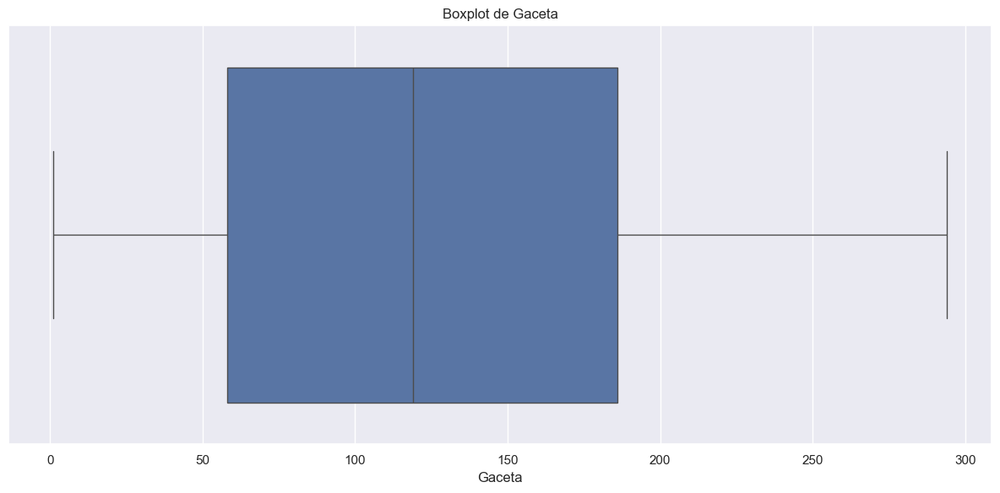

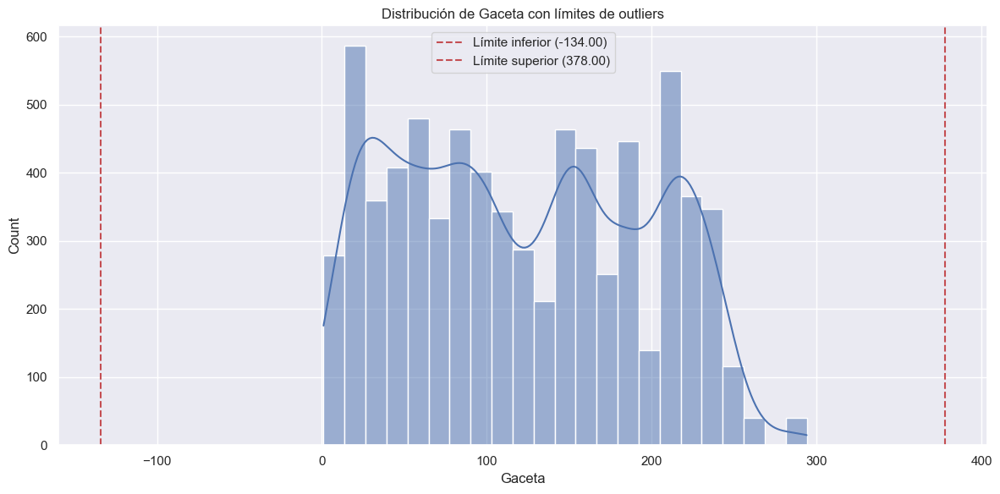


Columna: Tipo de Cambio
- Límite inferior: 402.92
- Q1: 505.35
- Q3: 573.64
- Límite superior: 676.07
- Número de outliers: 659
- Porcentaje de outliers: 8.96%


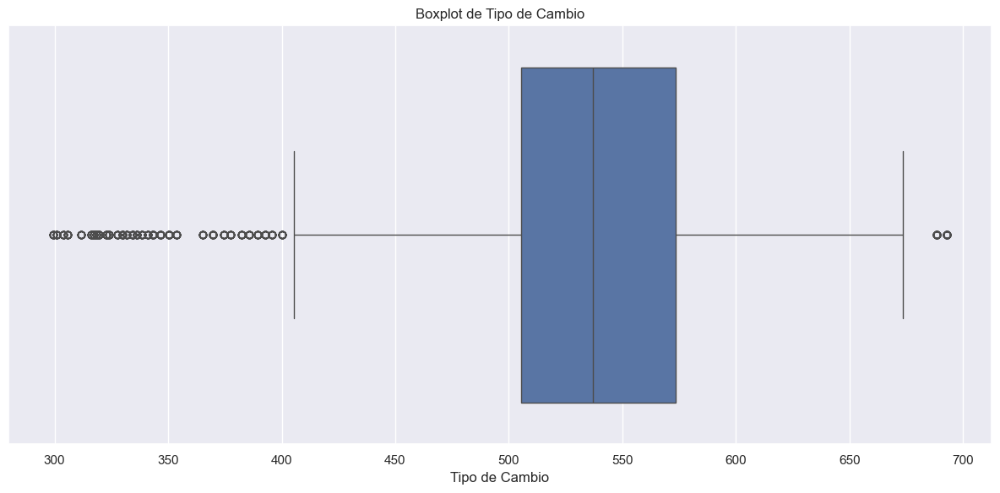

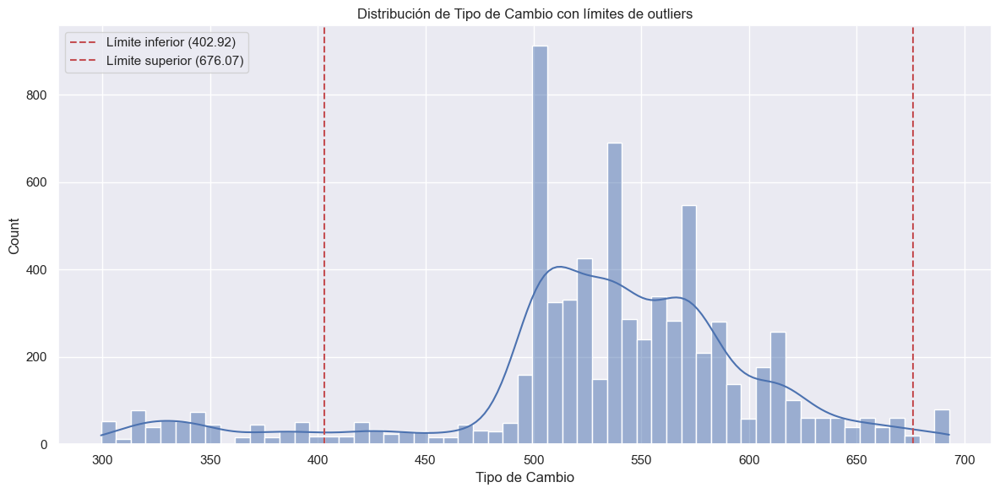


Columna: Precio Referencia Internacional
- Límite inferior: -57.61
- Q1: 28.69
- Q3: 86.22
- Límite superior: 172.51
- Número de outliers: 72
- Porcentaje de outliers: 0.98%


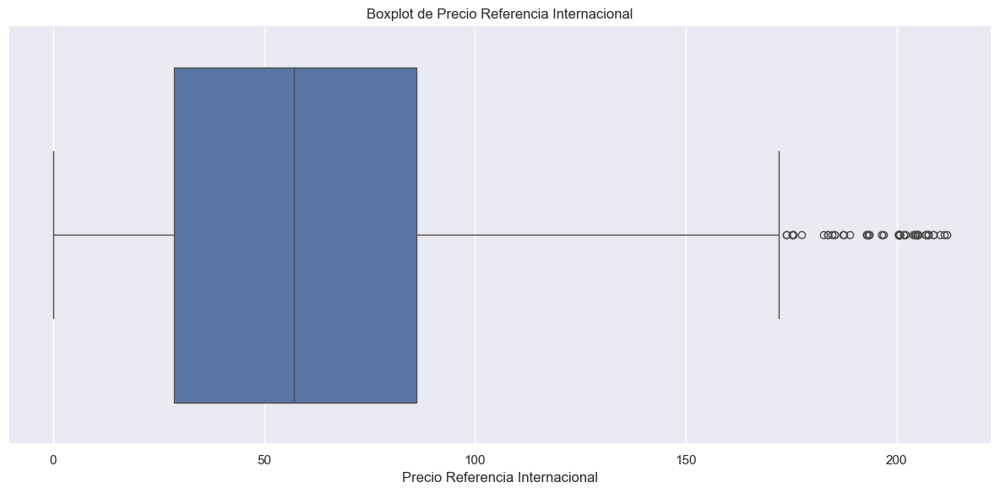

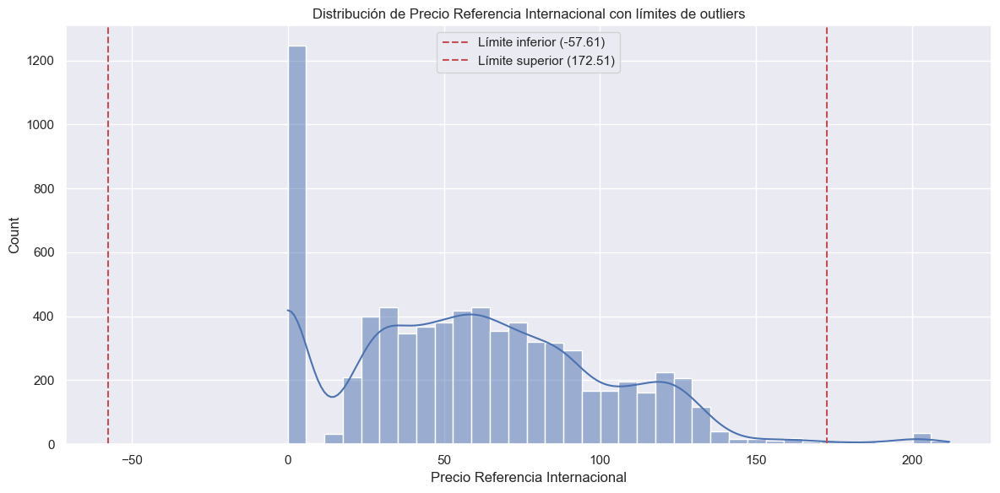


Columna: Precio Referencia Internacional en colones
- Límite inferior: -263.97
- Q1: 72.50
- Q3: 296.81
- Límite superior: 633.28
- Número de outliers: 68
- Porcentaje de outliers: 0.92%


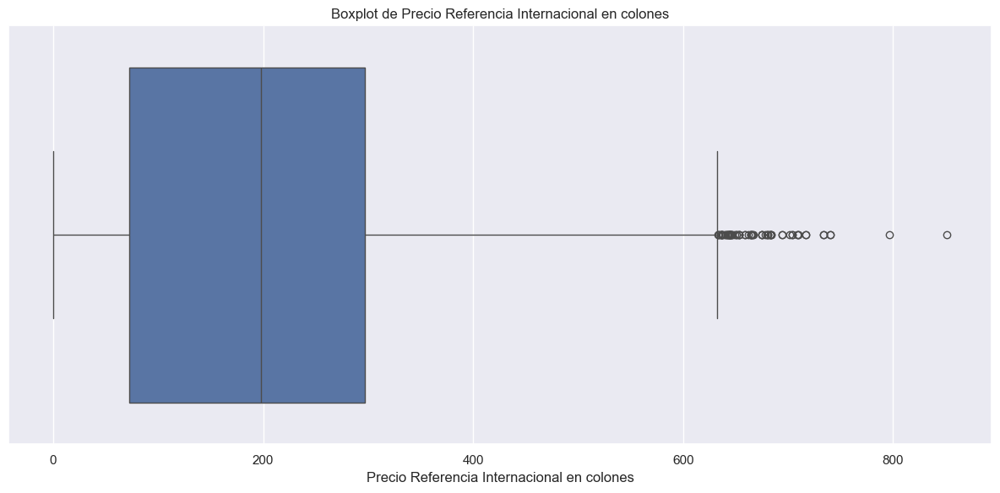

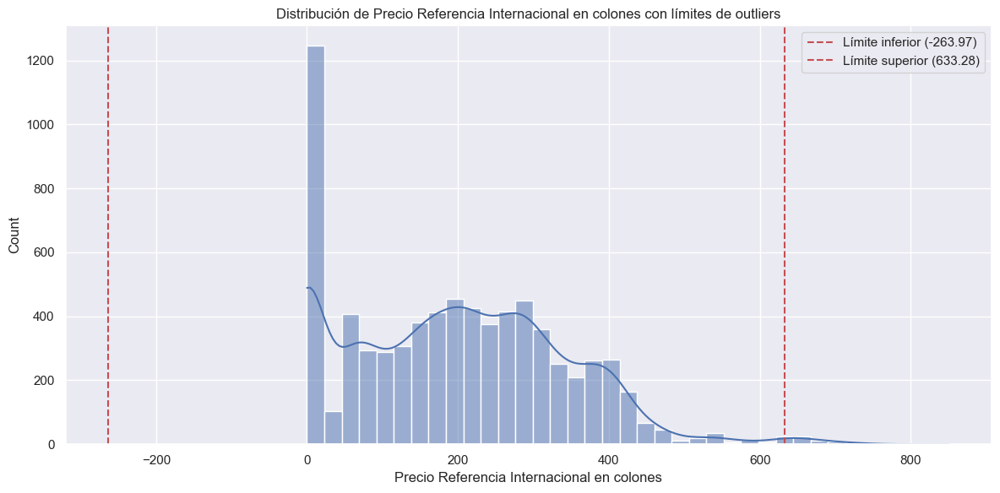


Columna: Otros Ingresos Prorrateados
- Límite inferior: -0.03
- Q1: -0.01
- Q3: 0.00
- Límite superior: 0.02
- Número de outliers: 1226
- Porcentaje de outliers: 16.67%


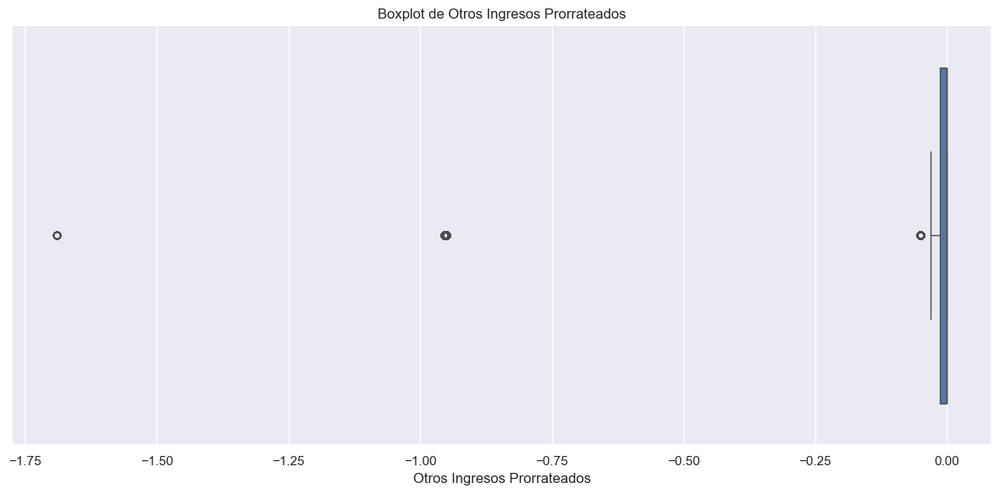

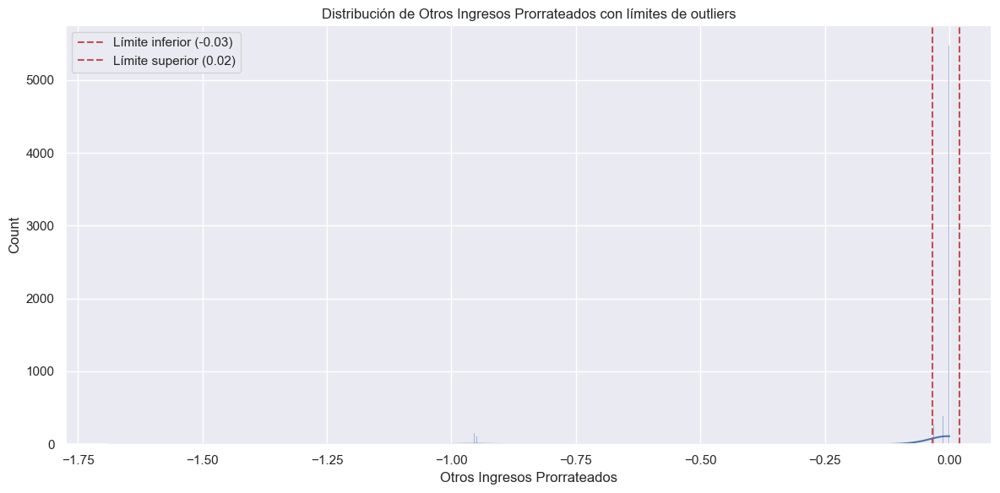

In [61]:
#@lru_cache(maxsize=32)  # Cachear resultados para columnas frecuentemente analizadas
def detectar_outliers(serie):
    """
    Detecta outliers basado en IQR para una serie.
    
    Args:
        serie: Serie de pandas
    
    Returns:
        tuple: (outliers, limite_inferior, limite_superior, Q1, Q3)
    """
    # Calcular cuartiles una sola vez
    Q1 = serie.quantile(0.25)
    Q3 = serie.quantile(0.75)
    IQR = Q3 - Q1
    
    # Calcular límites
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    
    # Identificar outliers (uso de vectorización)
    mask_outliers = (serie < limite_inferior) | (serie > limite_superior)
    outliers = serie[mask_outliers]
    
    return outliers, limite_inferior, limite_superior, Q1, Q3

def analizar_outliers(dataframe, max_cols=5, threshold_missing=0.5, plot=True):
    """
    Analiza y visualiza outliers en columnas numéricas.
    
    Args:
        dataframe: DataFrame de pandas
        max_cols: Número máximo de columnas a analizar
        threshold_missing: Umbral de valores faltantes para excluir columnas
        plot: Si True, genera visualizaciones
    
    Returns:
        dict: Resultados del análisis de outliers
    """
    print("\nDetección de valores atípicos en columnas numéricas:")
    
    # Seleccionar columnas numéricas con suficientes valores únicos
    # Uso de list comprehension para mayor eficiencia
    cols_numericas = dataframe.select_dtypes(include=["float64", "int64"]).columns
    cols_numericas_sample = [c for c in cols_numericas 
                           if dataframe[c].nunique() > 5 
                           and dataframe[c].isnull().sum() / len(dataframe) < threshold_missing][:max_cols]
    
    resultados = {}
    figuras = []
    
    for col in cols_numericas_sample:
        # Usar valores no nulos directamente
        serie_limpia = dataframe[col].dropna()
        
        # Detectar outliers (usando caché)
        outliers, limite_inferior, limite_superior, Q1, Q3 = detectar_outliers(serie_limpia)
        
        # Guardar resultados
        info_outliers = {
            "limite_inferior": limite_inferior,
            "Q1": Q1,
            "Q3": Q3,
            "limite_superior": limite_superior,
            "n_outliers": len(outliers),
            "porcentaje_outliers": (len(outliers) / serie_limpia.count()) * 100
        }
        resultados[col] = info_outliers
        
        # Imprimir información
        print(f"\nColumna: {col}")
        print(f"- Límite inferior: {limite_inferior:.2f}")
        print(f"- Q1: {Q1:.2f}")
        print(f"- Q3: {Q3:.2f}")
        print(f"- Límite superior: {limite_superior:.2f}")
        print(f"- Número de outliers: {len(outliers)}")
        print(f"- Porcentaje de outliers: {info_outliers['porcentaje_outliers']:.2f}%")
        
        if plot:
            # Visualización de boxplot
            plt.figure(figsize=(12, 6))
            sns.boxplot(x=serie_limpia)
            plt.title(f'Boxplot de {col}')
            plt.tight_layout()
            figuras.append(plt.gcf())
            plt.show()
            
            # Visualización de la distribución
            plt.figure(figsize=(12, 6))
            sns.histplot(serie_limpia, kde=True)
            plt.axvline(x=limite_inferior, color='r', linestyle='--', label=f'Límite inferior ({limite_inferior:.2f})')
            plt.axvline(x=limite_superior, color='r', linestyle='--', label=f'Límite superior ({limite_superior:.2f})')
            plt.title(f'Distribución de {col} con límites de outliers')
            plt.legend()
            plt.tight_layout()
            figuras.append(plt.gcf())
            plt.show()
    
    # Visualización interactiva con Plotly (si hay al menos 2 columnas)
    if len(cols_numericas_sample) >= 2 and plot:
        col1, col2 = cols_numericas_sample[:2]
        
        # Crear figura una sola vez
        fig = px.scatter(
            dataframe.dropna(subset=[col1, col2]), 
            x=col1, 
            y=col2, 
            opacity=0.7,
            title=f'Diagrama de dispersión entre {col1} y {col2}',
            labels={col1: col1, col2: col2}
        )
        
        # Obtener límites
        _, lim_inf_1, lim_sup_1, _, _ = detectar_outliers(dataframe[col1].dropna())
        _, lim_inf_2, lim_sup_2, _, _ = detectar_outliers(dataframe[col2].dropna())
        
        # Añadir límites
        y_min, y_max = dataframe[col2].min(), dataframe[col2].max()
        x_min, x_max = dataframe[col1].min(), dataframe[col1].max()
        
        # Preparar todas las líneas de una vez
        shapes = [
            dict(type="line", x0=lim_inf_1, y0=y_min, x1=lim_inf_1, y1=y_max,
                 line=dict(color="Red", width=2, dash="dash")),
            dict(type="line", x0=lim_sup_1, y0=y_min, x1=lim_sup_1, y1=y_max,
                 line=dict(color="Red", width=2, dash="dash")),
            dict(type="line", x0=x_min, y0=lim_inf_2, x1=x_max, y1=lim_inf_2,
                 line=dict(color="Green", width=2, dash="dash")),
            dict(type="line", x0=x_min, y0=lim_sup_2, x1=x_max, y1=lim_sup_2,
                 line=dict(color="Green", width=2, dash="dash"))
        ]
        
        # Añadir todas las formas de una vez
        fig.update_layout(shapes=shapes)
        fig.show()
        
        figuras.append(fig)
    
    return resultados, figuras

# Ejecutar análisis de outliers
resultados_outliers, figuras_outliers = analizar_outliers(df_clean, max_cols=5)

Columnas con outliers detectadas automáticamente: ['Tipo de Cambio', 'Precio Referencia Internacional', 'Precio Referencia Internacional en colones', 'Otros Ingresos Prorrateados', 'Asignación Subsidio Pescadores', 'Asignación subsidio Política Sectorial', 'Subsidio Pescadores', 'Subsidio Política Sectorial', 'Diferencial de precios', 'Canon', 'Margen de operación de Recope', 'Rendimiento sobre Base Tarifaria', 'Precio en terminal sin impuesto', 'Precio en terminal con impuesto', 'Precio final sin punto fijo Peddlers', 'Margen Estaciones Terrestres', 'Margen Estaciones Aéreas', 'Flete estaciones de servicio', 'Margen Envasador', 'Precio final en estaciones de servicio', 'Margen Distribuidor y Agencias', 'Margen Detallista', 'Precio gas por litro en detallistas']

Aplicando método: winsorize

Procesando outliers en columna: Tipo de Cambio
- Corrigiendo 659 outliers (8.96%)
  - Outliers inferiores reemplazados con percentil 5.0%: 350.39
  - Outliers superiores reemplazados con percentil 

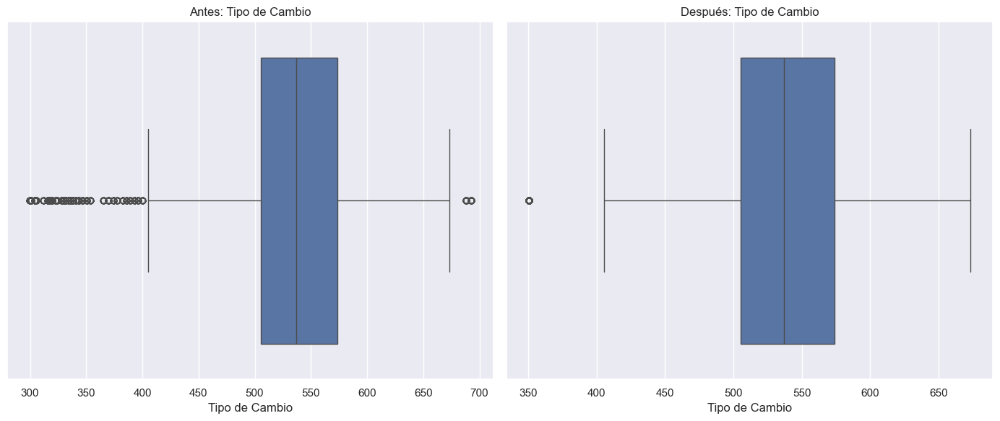

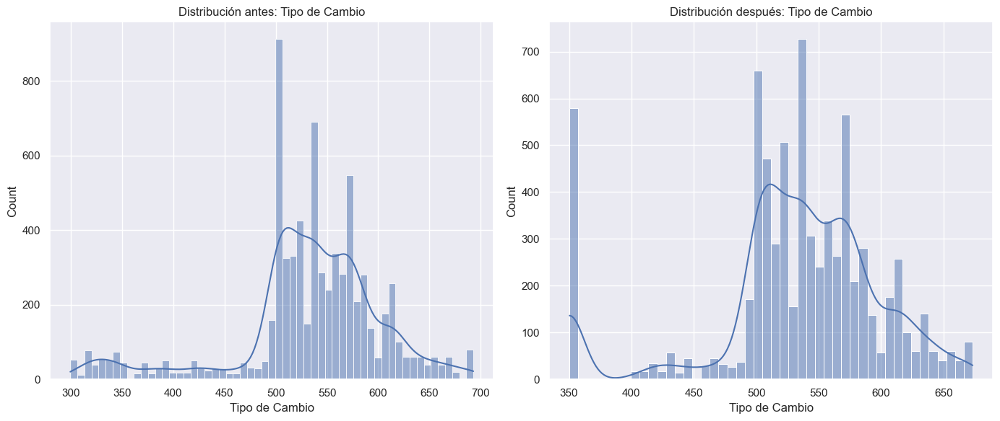

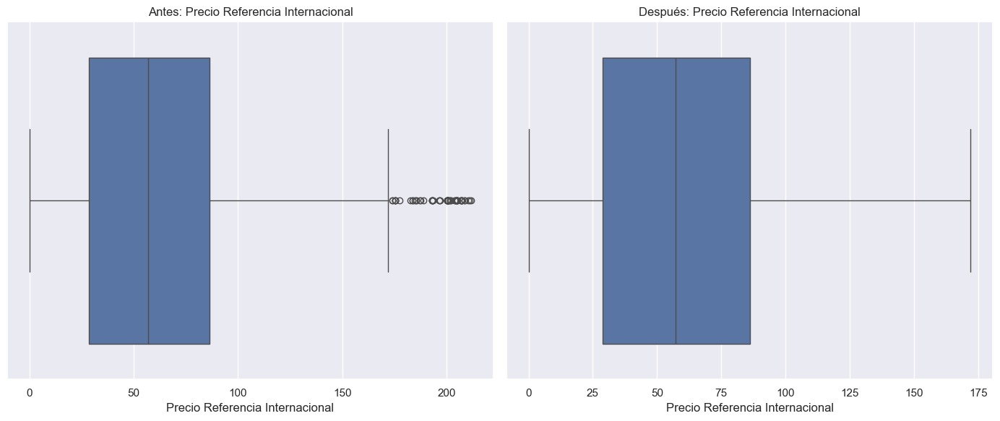

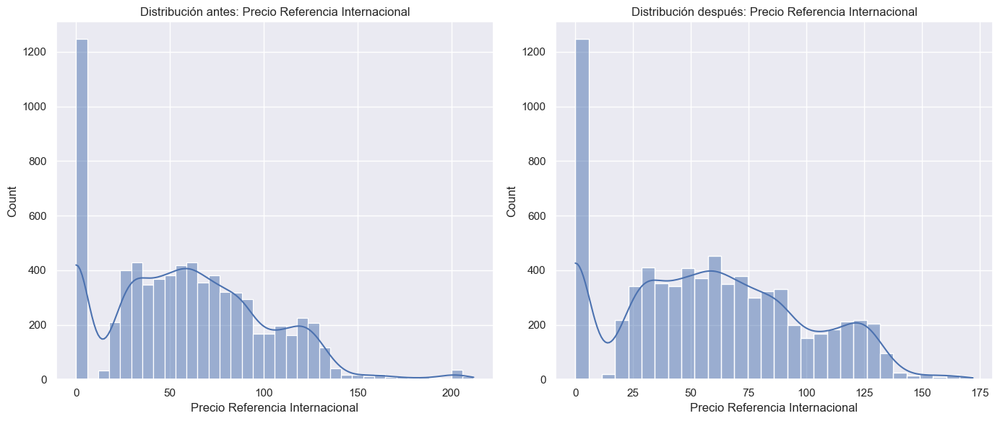

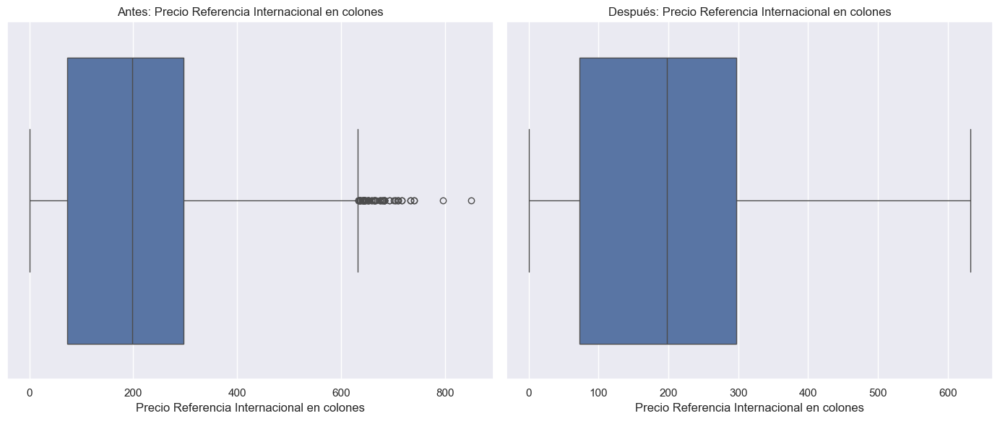

...

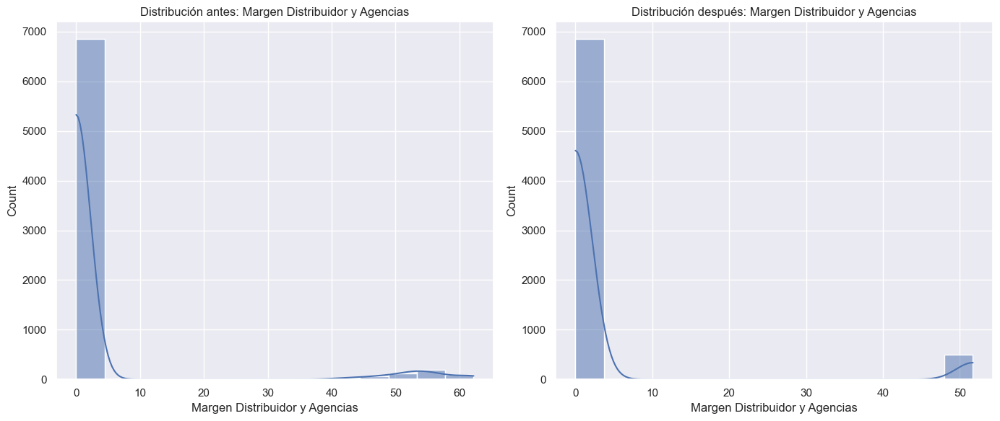

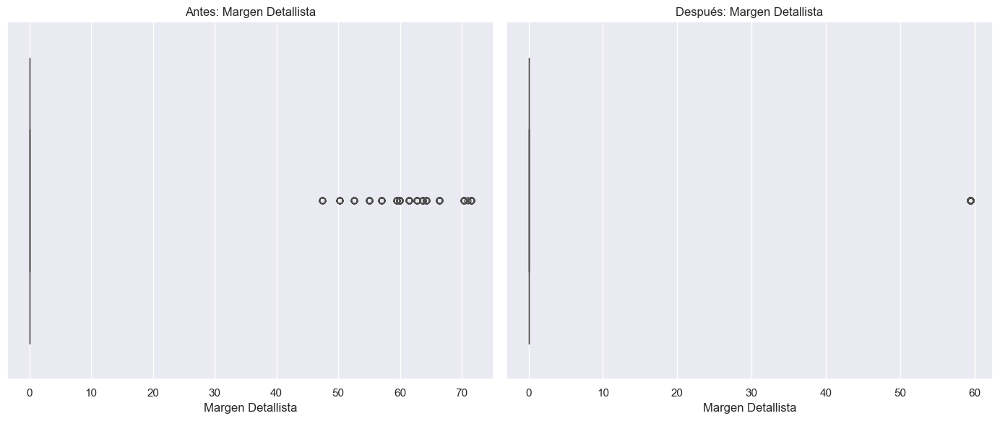

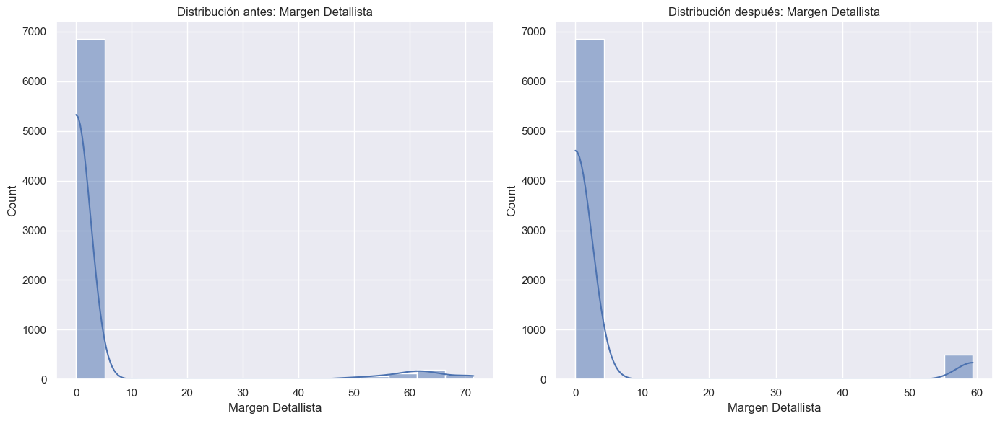

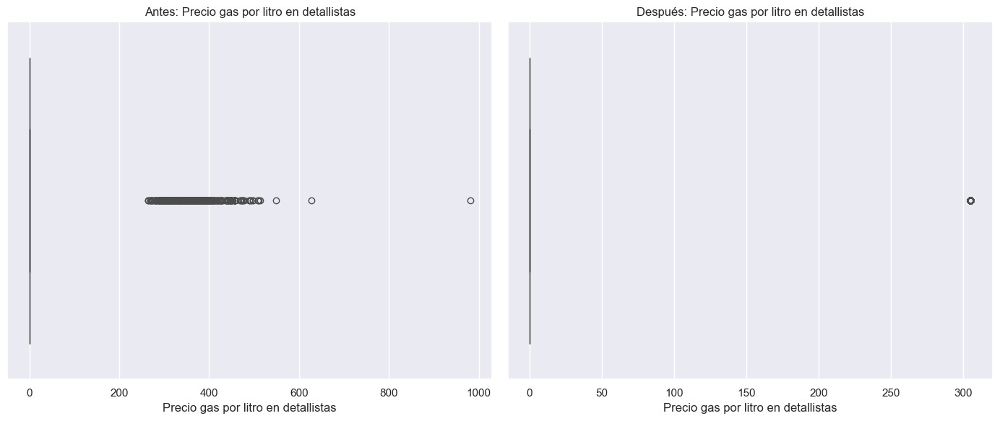

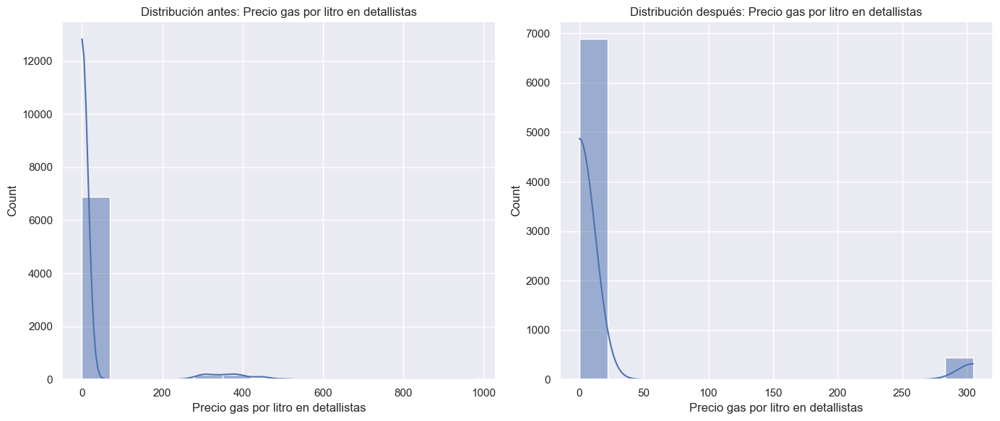


Resumen de cambios tras corrección de outliers:
                                       columna  outliers_antes  \
0                               Tipo de Cambio             659   
1              Precio Referencia Internacional              72   
2   Precio Referencia Internacional en colones              68   
3                  Otros Ingresos Prorrateados            1226   
4               Asignación Subsidio Pescadores             859   
5       Asignación subsidio Política Sectorial            1137   
6                          Subsidio Pescadores             472   
7                  Subsidio Política Sectorial            1061   
8                       Diferencial de precios            2565   
9                                        Canon             252   
10               Margen de operación de Recope             196   
11            Rendimiento sobre Base Tarifaria             154   
12             Precio en terminal sin impuesto             237   
13             Precio en te

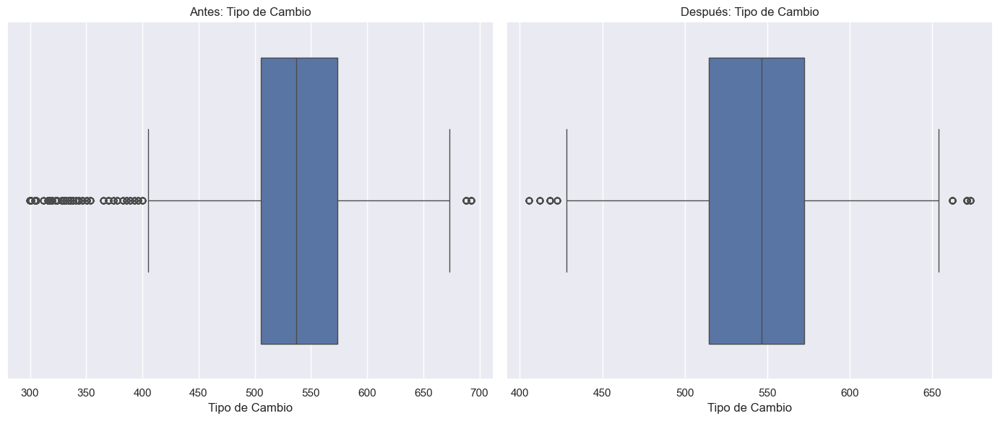

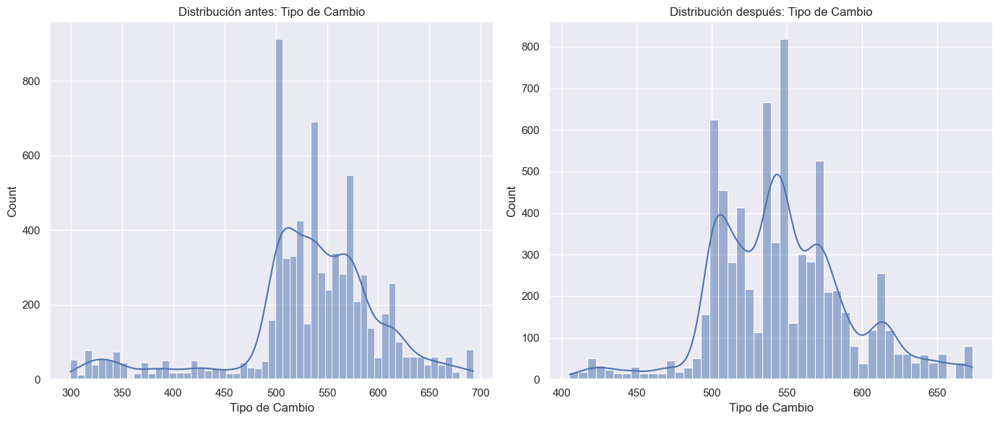

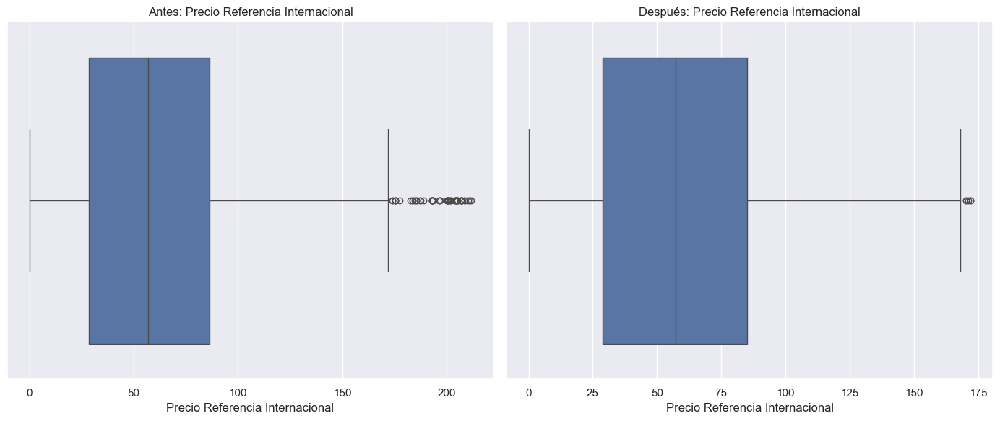

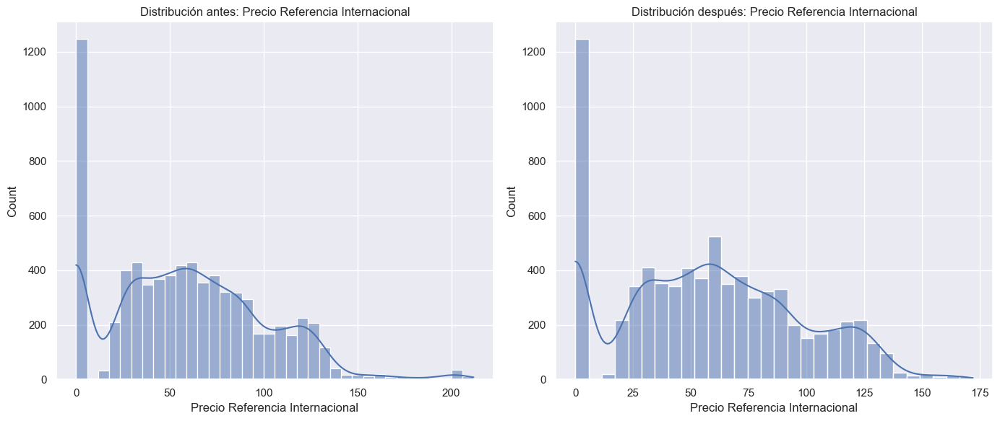

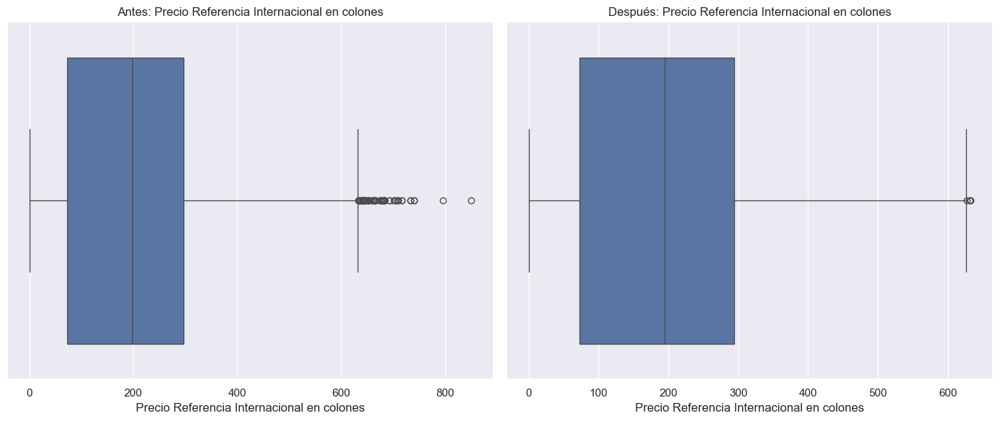

...

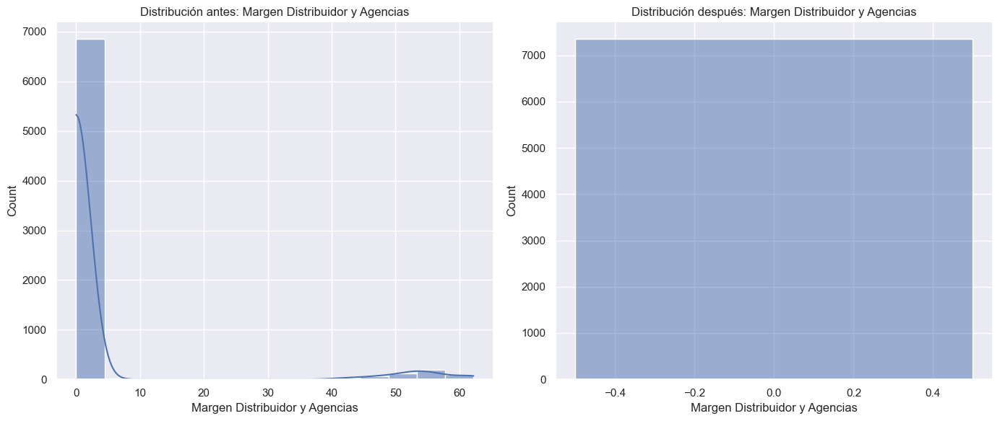

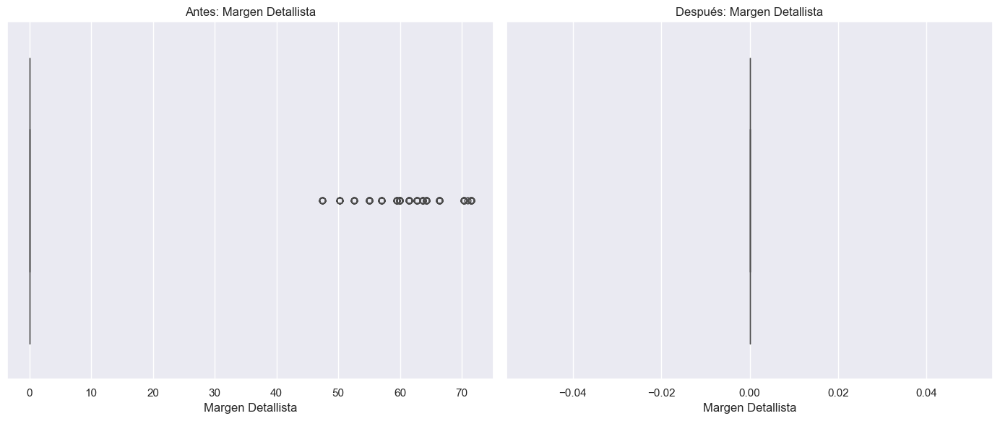

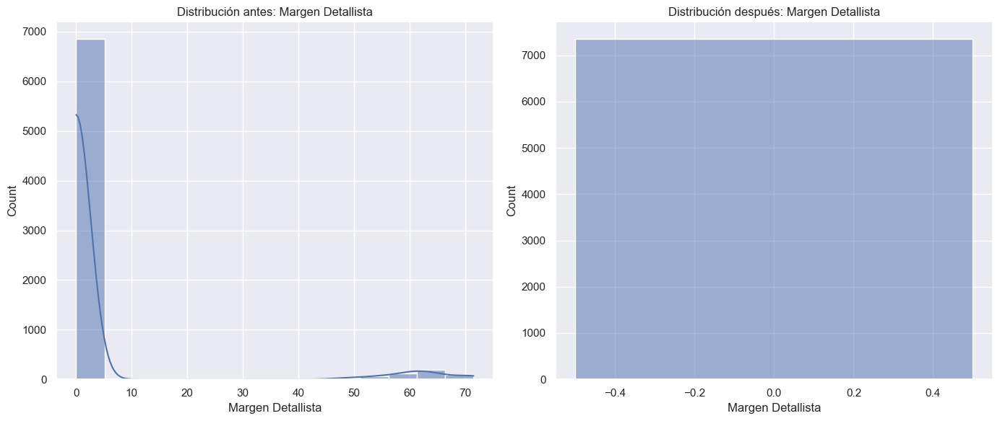

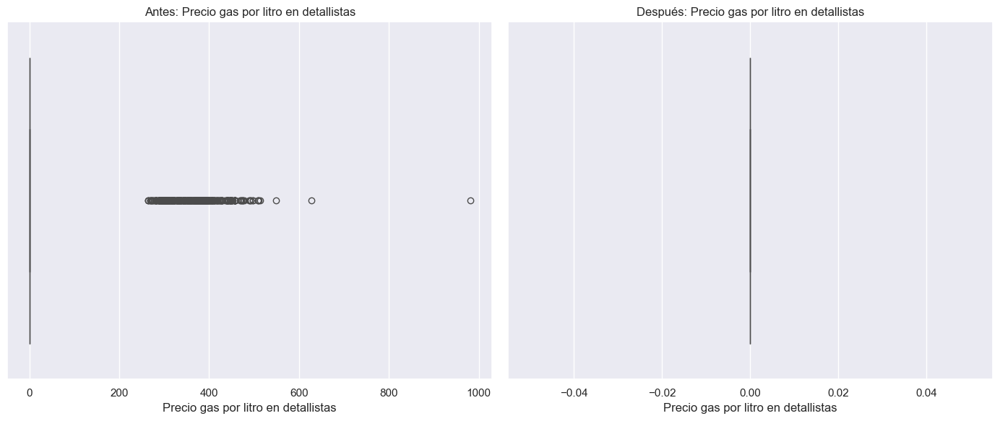

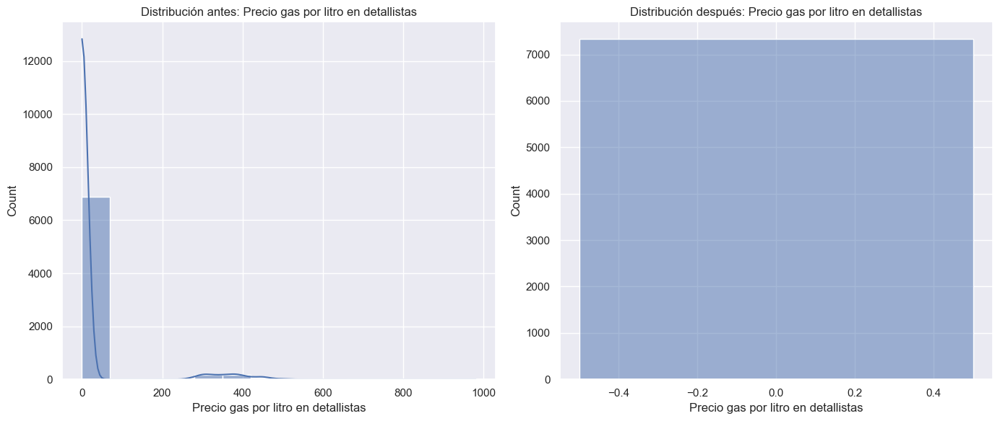


Resumen de cambios tras corrección de outliers:
                                       columna  outliers_antes  \
0                               Tipo de Cambio             659   
1              Precio Referencia Internacional              72   
2   Precio Referencia Internacional en colones              68   
3                  Otros Ingresos Prorrateados            1226   
4               Asignación Subsidio Pescadores             859   
5       Asignación subsidio Política Sectorial            1137   
6                          Subsidio Pescadores             472   
7                  Subsidio Política Sectorial            1061   
8                       Diferencial de precios            2565   
9                                        Canon             252   
10               Margen de operación de Recope             196   
11            Rendimiento sobre Base Tarifaria             154   
12             Precio en terminal sin impuesto             237   
13             Precio en te

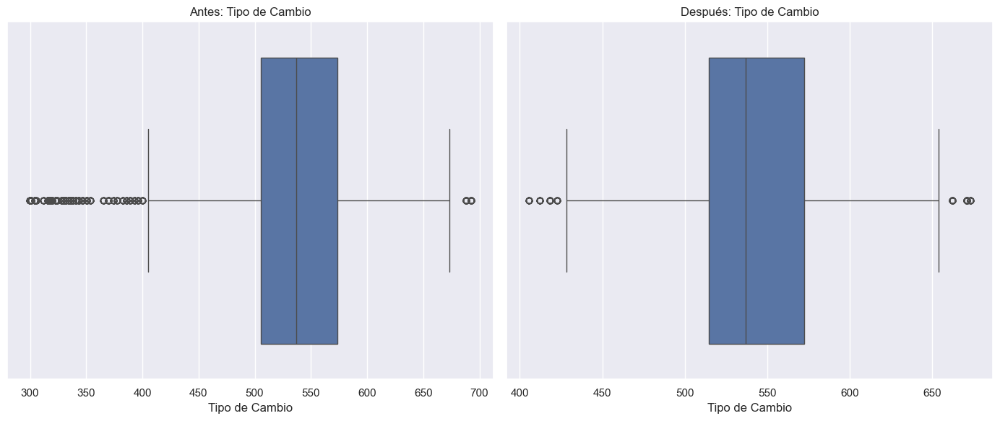

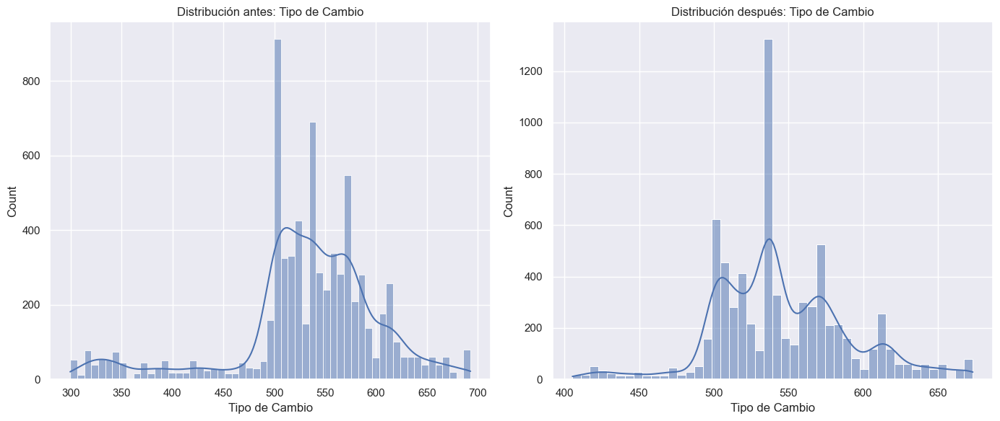

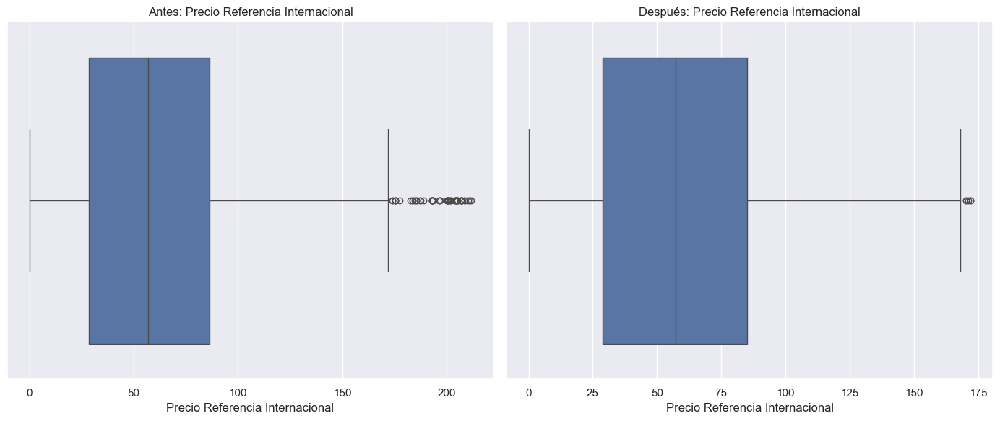

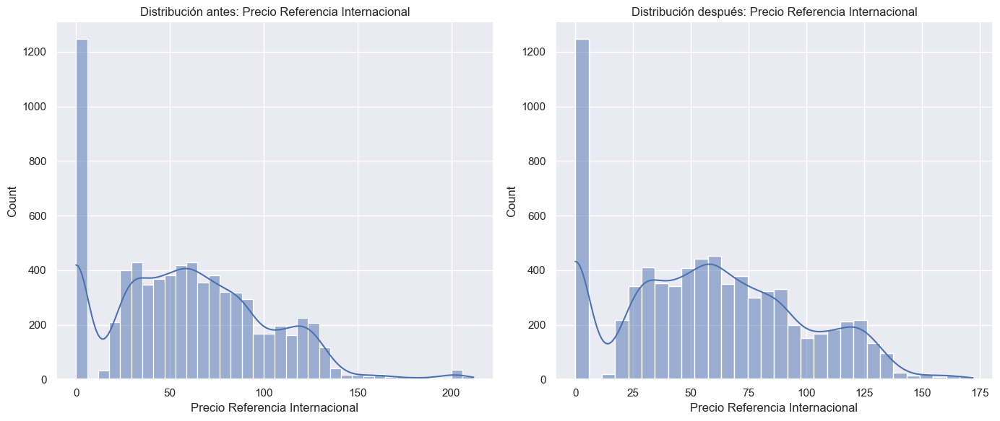

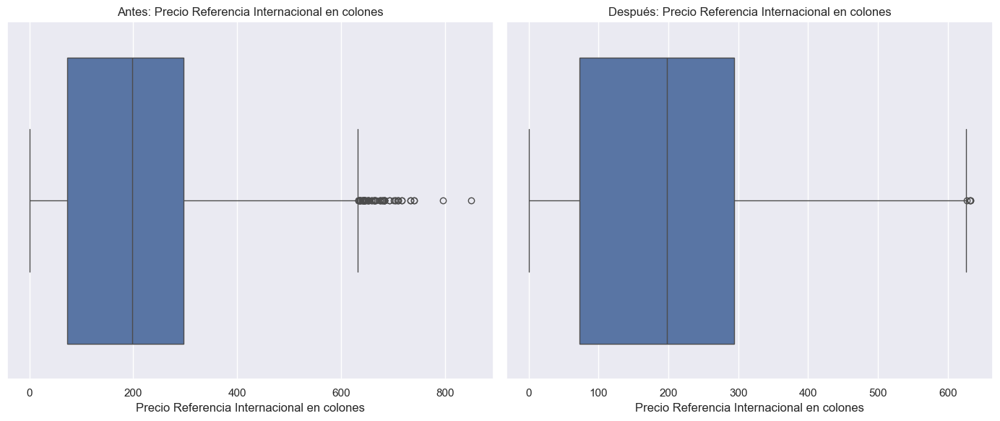

...

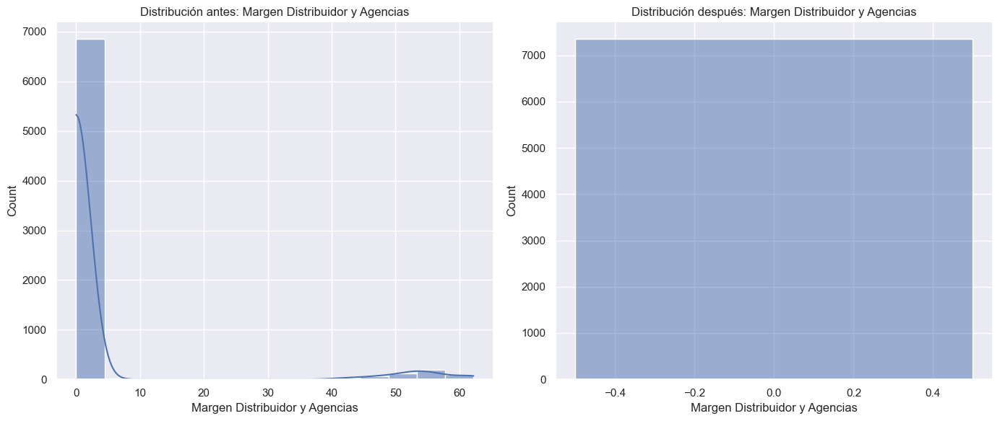

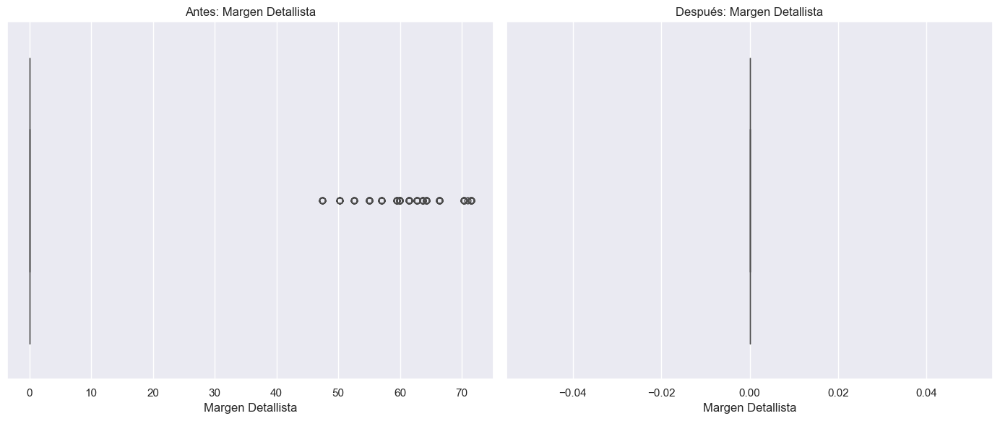

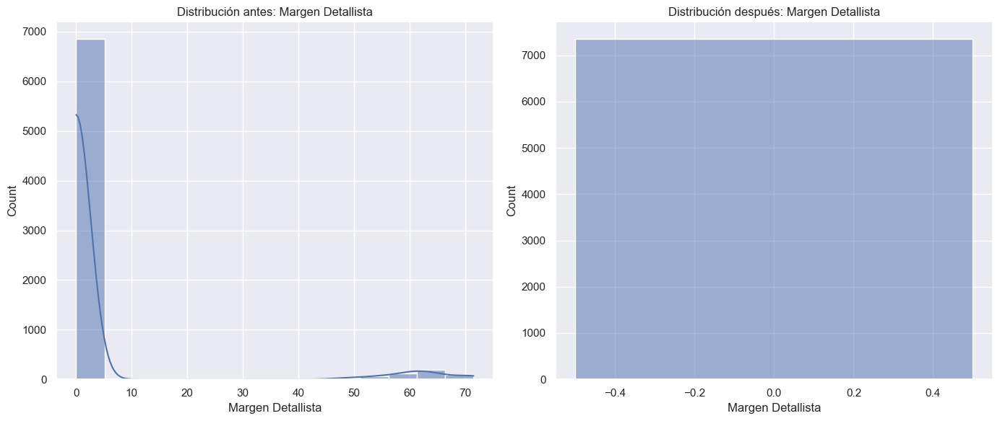

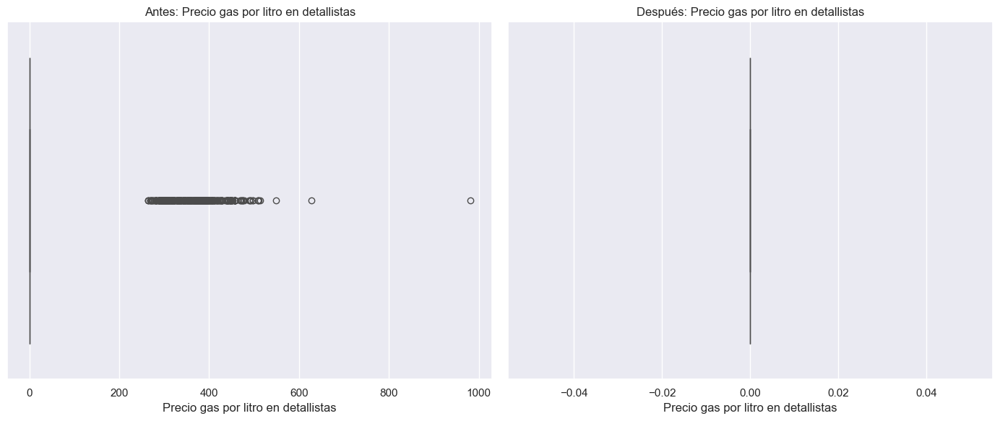

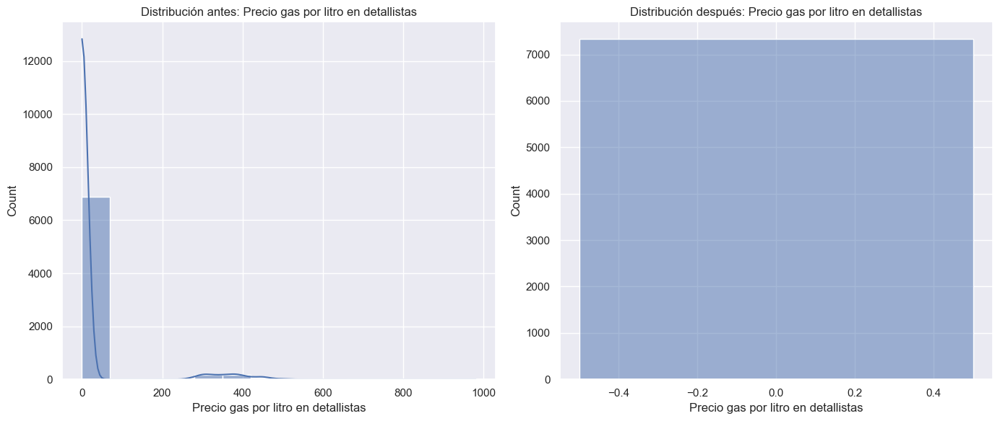


Resumen de cambios tras corrección de outliers:
                                       columna  outliers_antes  \
0                               Tipo de Cambio             659   
1              Precio Referencia Internacional              72   
2   Precio Referencia Internacional en colones              68   
3                  Otros Ingresos Prorrateados            1226   
4               Asignación Subsidio Pescadores             859   
5       Asignación subsidio Política Sectorial            1137   
6                          Subsidio Pescadores             472   
7                  Subsidio Política Sectorial            1061   
8                       Diferencial de precios            2565   
9                                        Canon             252   
10               Margen de operación de Recope             196   
11            Rendimiento sobre Base Tarifaria             154   
12             Precio en terminal sin impuesto             237   
13             Precio en te

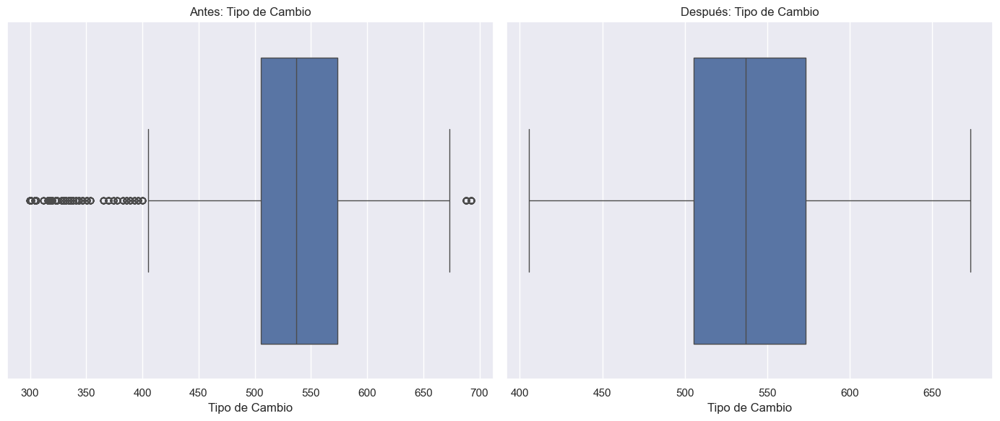

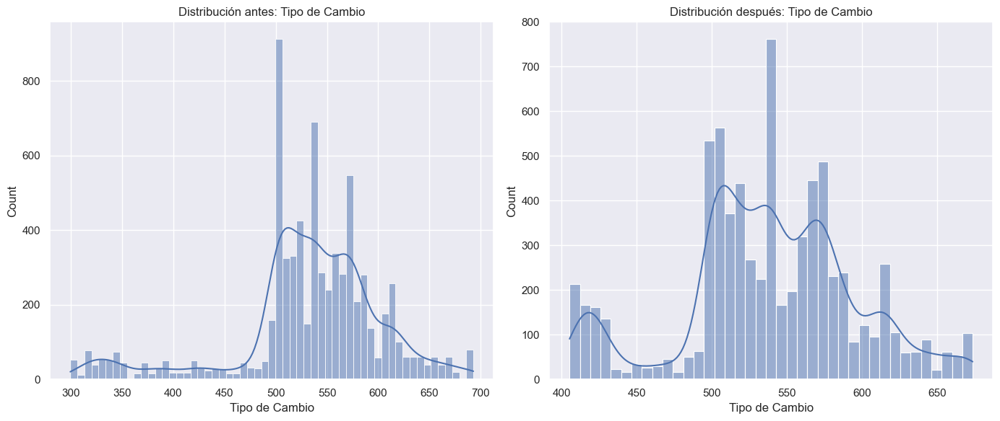

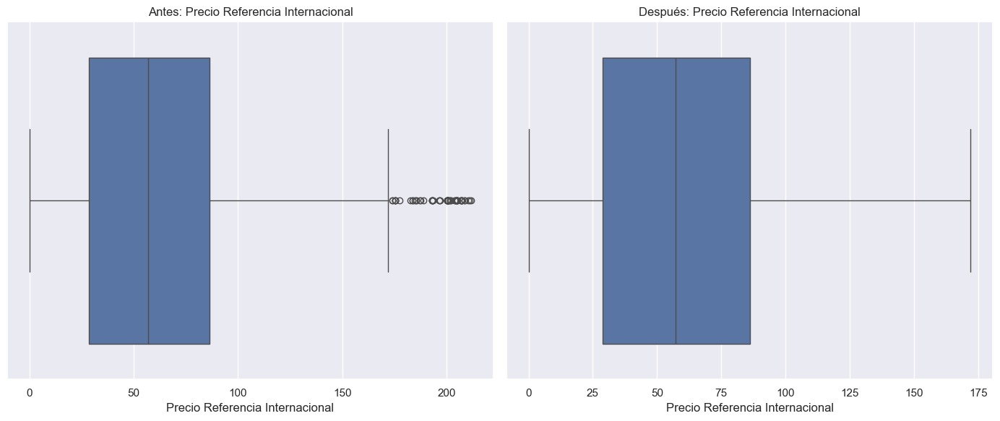

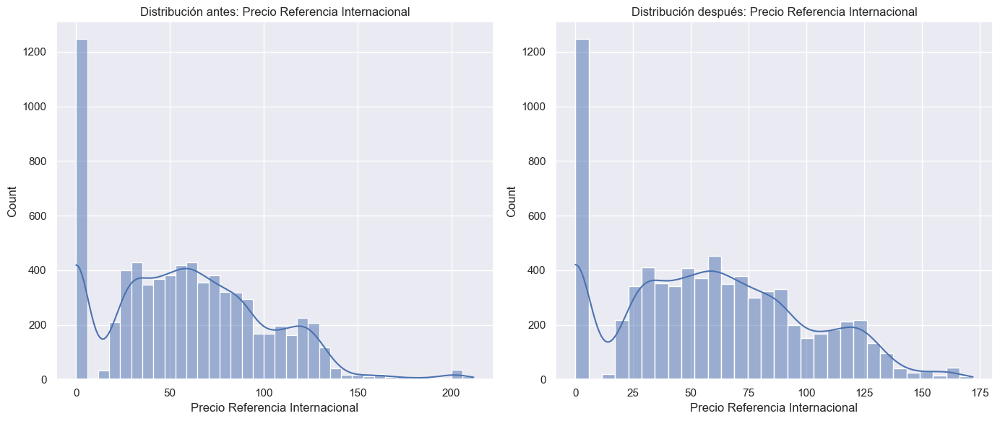

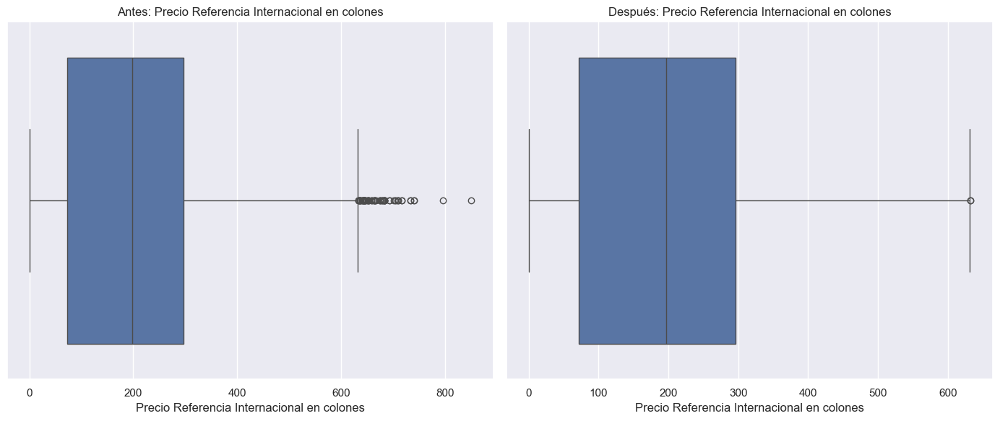

...

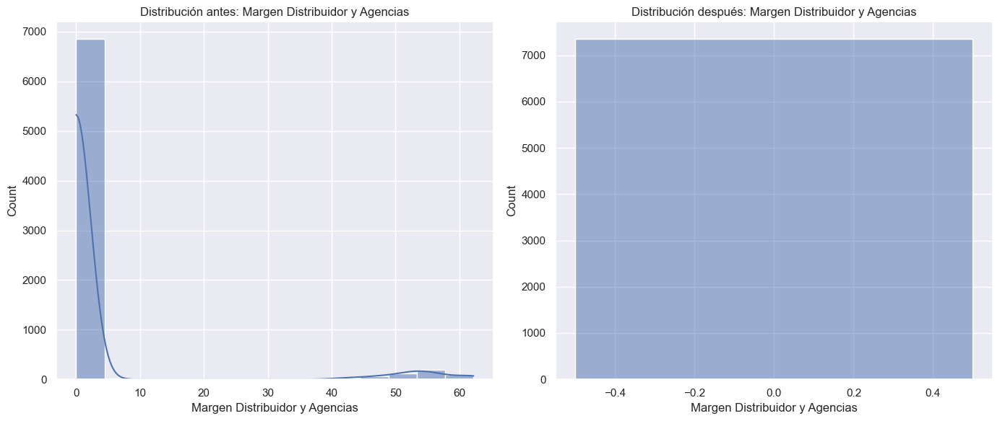

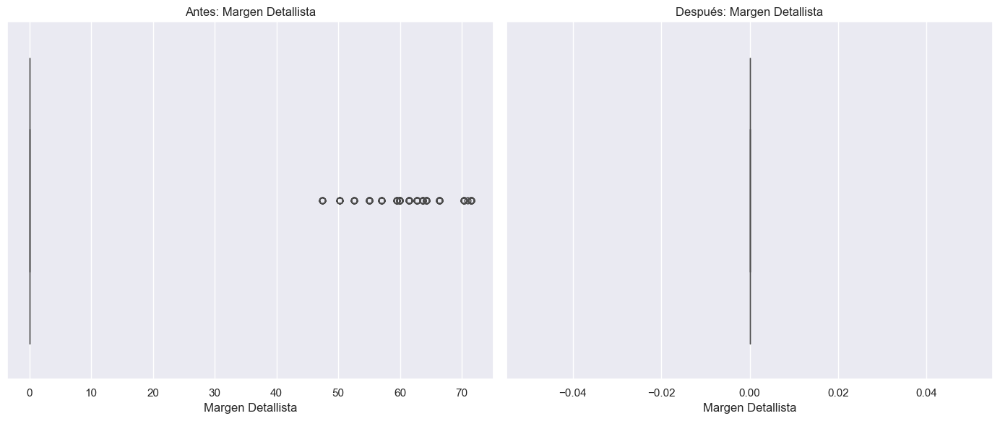

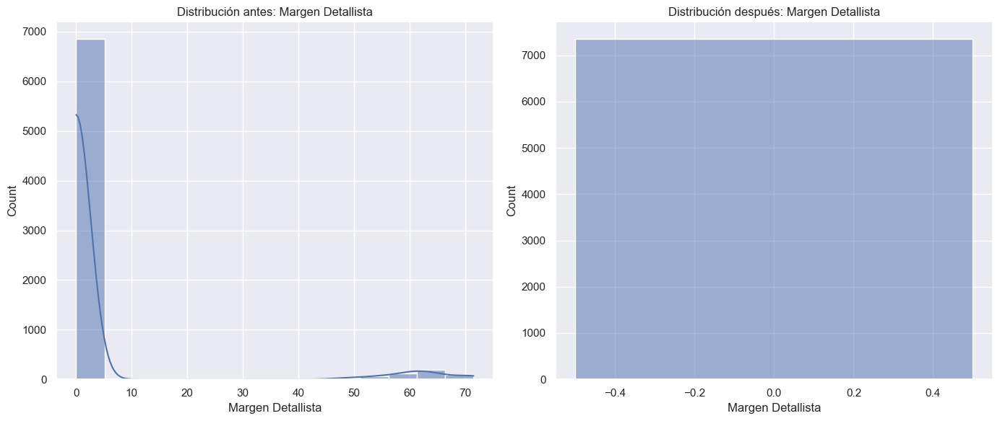

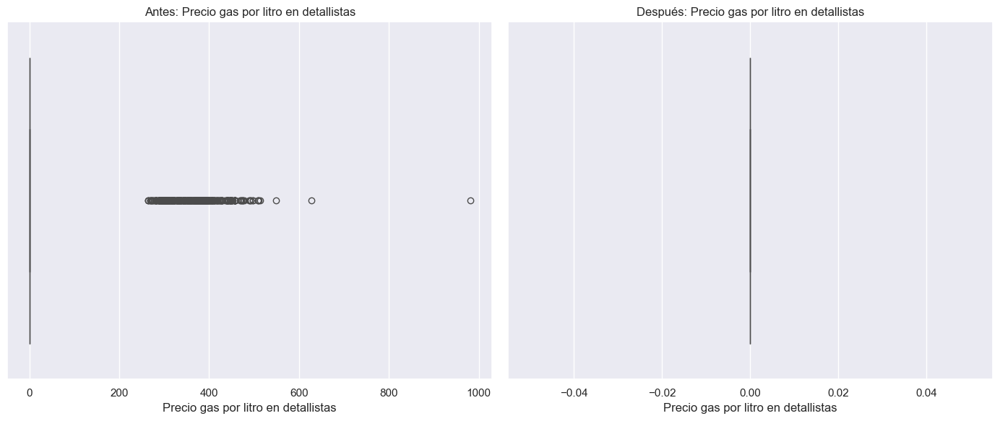

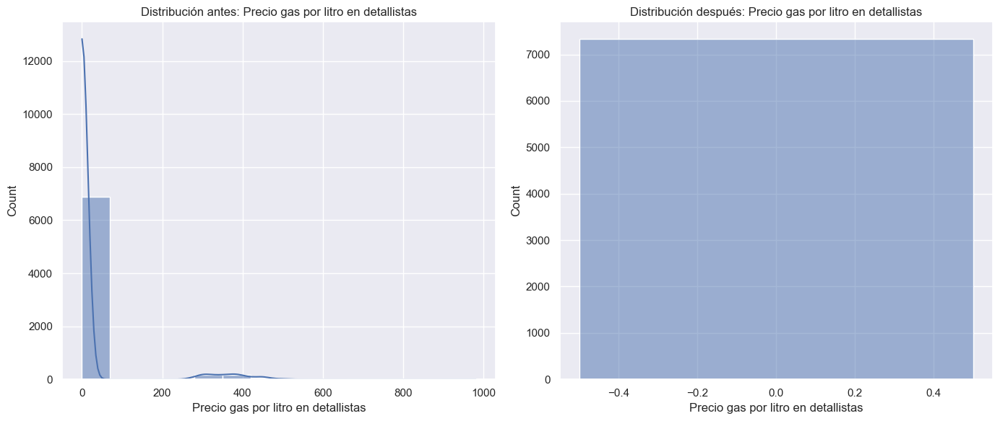


Resumen de cambios tras corrección de outliers:
                                       columna  outliers_antes  \
0                               Tipo de Cambio             659   
1              Precio Referencia Internacional              72   
2   Precio Referencia Internacional en colones              68   
3                  Otros Ingresos Prorrateados            1226   
4               Asignación Subsidio Pescadores             859   
5       Asignación subsidio Política Sectorial            1137   
6                          Subsidio Pescadores             472   
7                  Subsidio Política Sectorial            1061   
8                       Diferencial de precios            2565   
9                                        Canon             252   
10               Margen de operación de Recope             196   
11            Rendimiento sobre Base Tarifaria             154   
12             Precio en terminal sin impuesto             237   
13             Precio en te

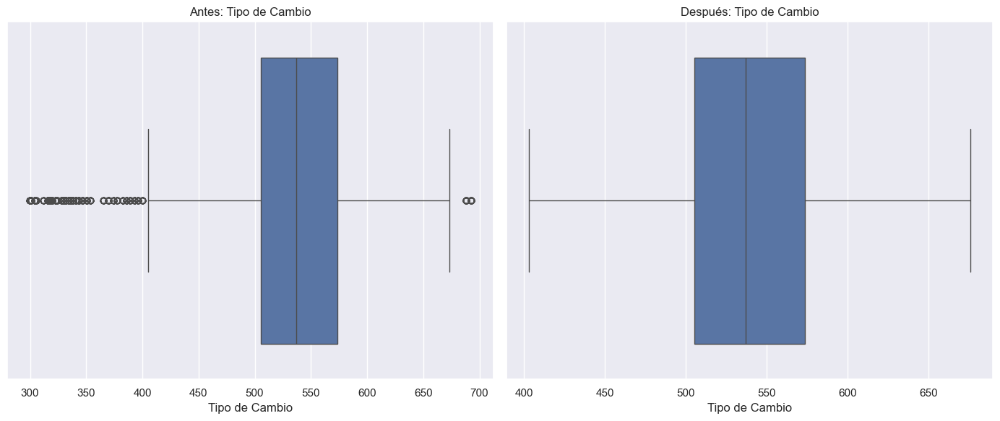

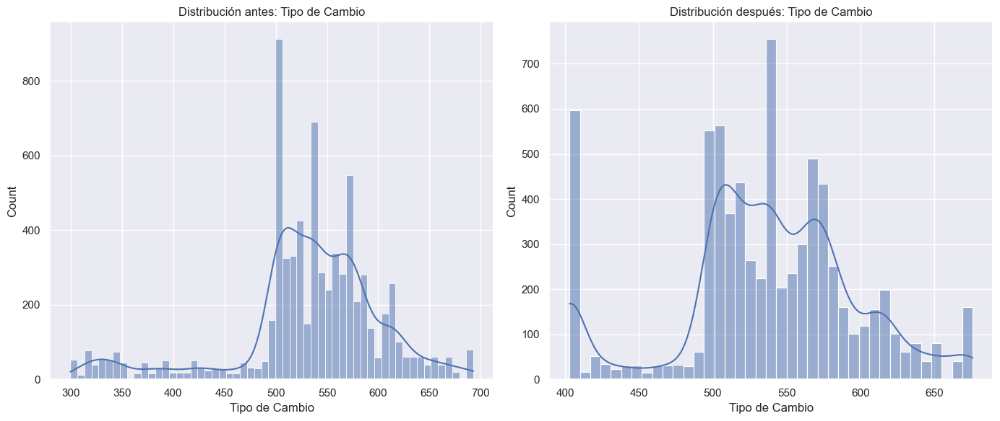

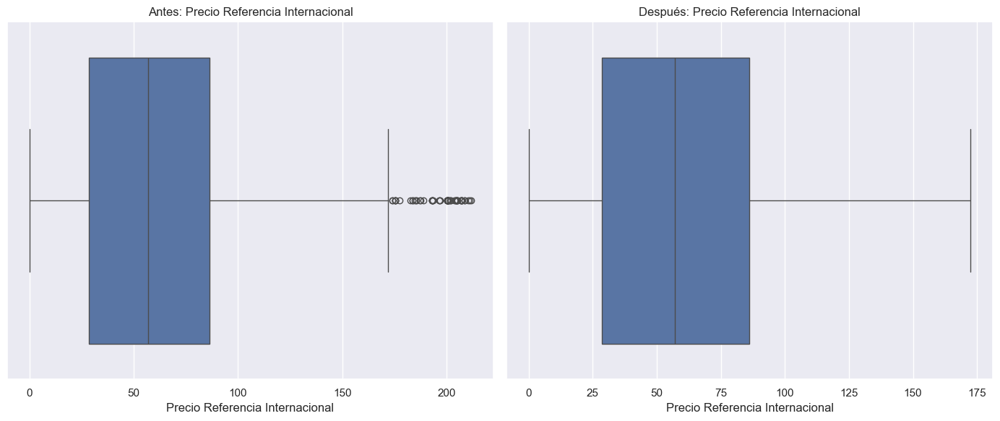

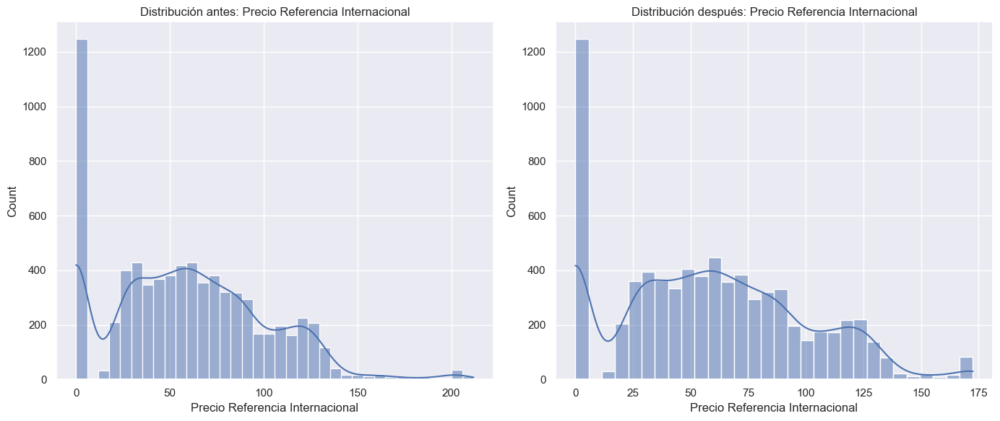

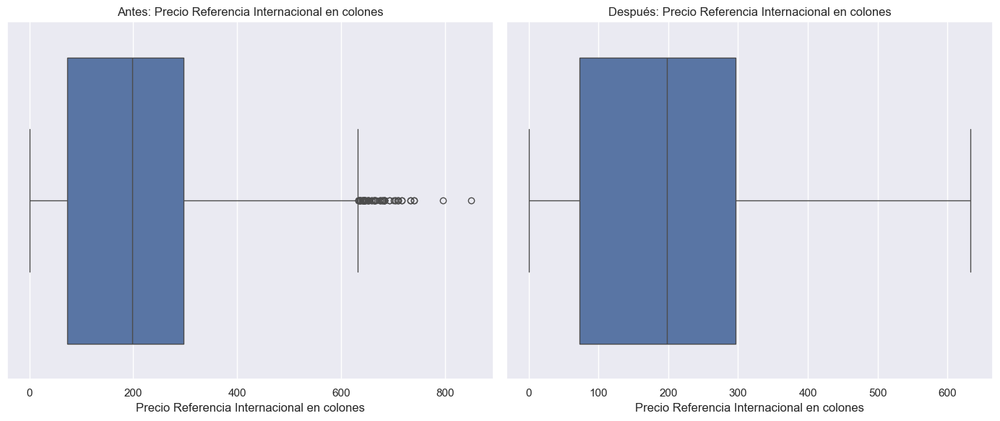

...

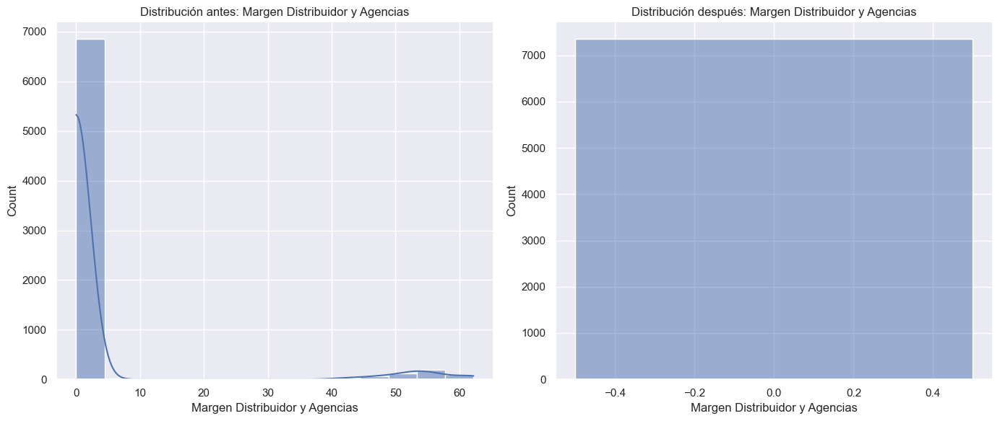

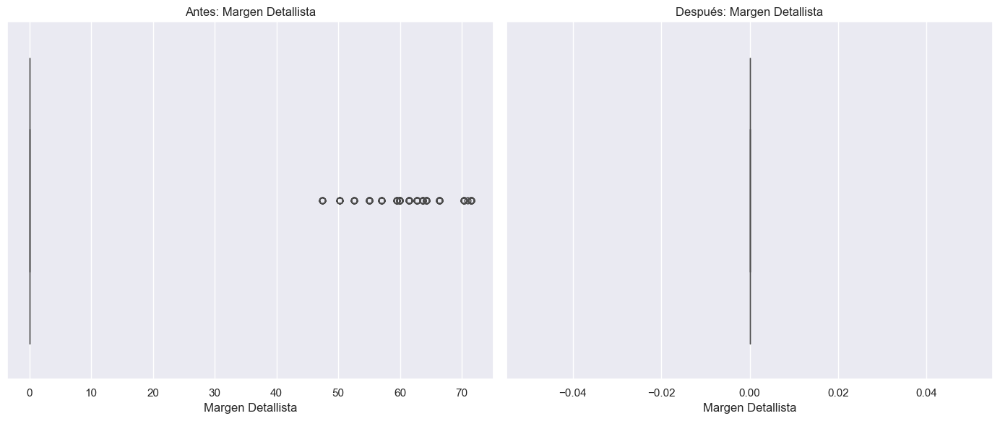

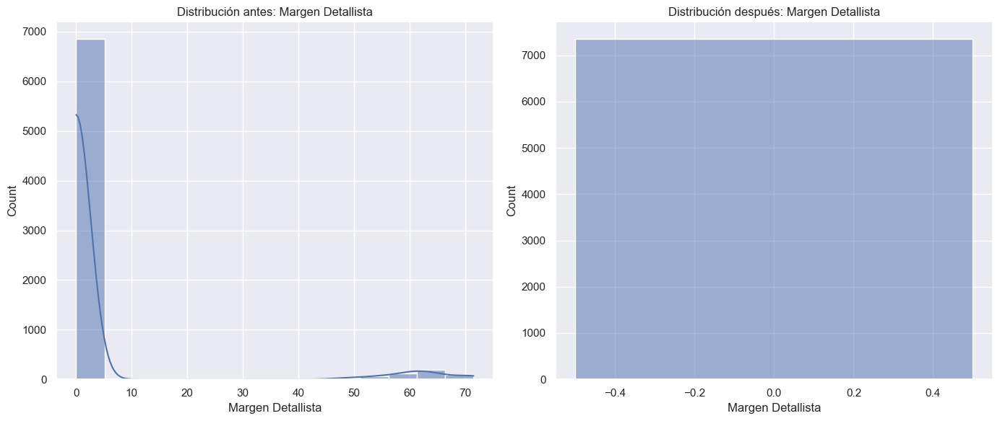

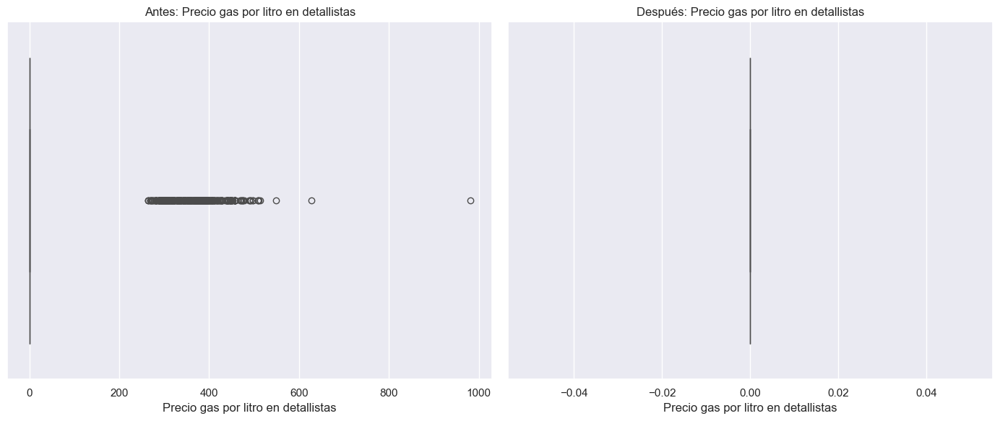

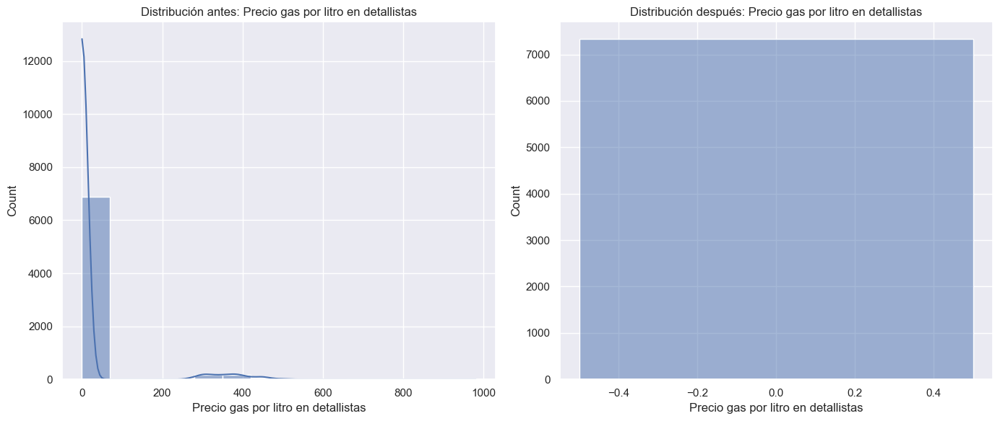


Resumen de cambios tras corrección de outliers:
                                       columna  outliers_antes  \
0                               Tipo de Cambio             659   
1              Precio Referencia Internacional              72   
2   Precio Referencia Internacional en colones              68   
3                  Otros Ingresos Prorrateados            1226   
4               Asignación Subsidio Pescadores             859   
5       Asignación subsidio Política Sectorial            1137   
6                          Subsidio Pescadores             472   
7                  Subsidio Política Sectorial            1061   
8                       Diferencial de precios            2565   
9                                        Canon             252   
10               Margen de operación de Recope             196   
11            Rendimiento sobre Base Tarifaria             154   
12             Precio en terminal sin impuesto             237   
13             Precio en te

In [62]:
def corregir_outliers(dataframe, columnas=None, metodo='winsorize', threshold_missing=0.5):
    """
    Corrige outliers en las columnas numéricas especificadas usando diferentes técnicas.
    
    Args:
        dataframe: DataFrame de pandas
        columnas: Lista de columnas a procesar (None = todas las numéricas elegibles)
        metodo: Método de corrección ('winsorize', 'media', 'mediana', 'knn', 'iqr_media')
        threshold_missing: Umbral de valores faltantes para excluir columnas
    
    Returns:
        DataFrame: Copia del DataFrame con outliers corregidos
    """
    import pandas as pd
    import numpy as np
    from scipy import stats
    from sklearn.impute import KNNImputer
    
    # Crear copia para no modificar el original
    df_corregido = dataframe.copy()
    
    # Seleccionar columnas numéricas si no se especificaron
    if columnas is None:
        cols_numericas = dataframe.select_dtypes(include=["float64", "int64"]).columns
        columnas = [c for c in cols_numericas 
                   if dataframe[c].nunique() > 5 
                   and dataframe[c].isnull().sum() / len(dataframe) < threshold_missing]
    
    # Procesar cada columna
    for col in columnas:
        print(f"\nProcesando outliers en columna: {col}")
        
        # Obtener información de outliers
        serie_limpia = df_corregido[col].dropna()
        outliers, limite_inferior, limite_superior, Q1, Q3 = detectar_outliers(serie_limpia)
        
        if len(outliers) == 0:
            print(f"- No se encontraron outliers en {col}")
            continue
        
        # Crear máscara para outliers
        mask_outliers = (df_corregido[col] < limite_inferior) | (df_corregido[col] > limite_superior)
        n_outliers = mask_outliers.sum()
        
        print(f"- Corrigiendo {n_outliers} outliers ({(n_outliers / len(df_corregido[col].dropna()) * 100):.2f}%)")
        
        # Aplicar el método de corrección seleccionado
        if metodo == 'winsorize':
            # Winsorización - reemplazar valores extremos con percentiles
            q_min, q_max = 0.05, 0.95  # Percentiles para winsorización
            valores_winsorized = stats.mstats.winsorize(df_corregido[col].dropna(), limits=[q_min, 1-q_max])
            
            # Reemplazar solo los outliers
            df_temp = df_corregido[col].copy()
            df_temp.loc[mask_outliers] = np.nan  # Marcar outliers como NaN temporalmente
            
            # Reemplazar outliers bajos con el percentil inferior
            mask_bajos = df_corregido[col] < limite_inferior
            if mask_bajos.any():
                valor_reemplazo_bajo = serie_limpia.quantile(q_min)
                df_corregido.loc[mask_bajos, col] = valor_reemplazo_bajo
                print(f"  - Outliers inferiores reemplazados con percentil {q_min*100}%: {valor_reemplazo_bajo:.2f}")
            
            # Reemplazar outliers altos con el percentil superior
            mask_altos = df_corregido[col] > limite_superior
            if mask_altos.any():
                valor_reemplazo_alto = serie_limpia.quantile(q_max)
                df_corregido.loc[mask_altos, col] = valor_reemplazo_alto
                print(f"  - Outliers superiores reemplazados con percentil {q_max*100}%: {valor_reemplazo_alto:.2f}")
        
        elif metodo == 'media':
            # Calcular media excluyendo outliers
            media_sin_outliers = serie_limpia[~((serie_limpia < limite_inferior) | (serie_limpia > limite_superior))].mean()
            df_corregido.loc[mask_outliers, col] = media_sin_outliers
            print(f"  - Outliers reemplazados con la media (sin outliers): {media_sin_outliers:.2f}")
        
        elif metodo == 'mediana':
            # Usar mediana de los datos (robusta a outliers)
            mediana = serie_limpia.median()
            df_corregido.loc[mask_outliers, col] = mediana
            print(f"  - Outliers reemplazados con la mediana: {mediana:.2f}")
        
        elif metodo == 'knn':
            # Usar KNN para imputar outliers
            print("  - Aplicando imputación KNN (puede tomar tiempo)...")
            
            # Marcar outliers como NaN temporalmente para imputación
            df_temp = df_corregido.copy()
            df_temp.loc[mask_outliers, col] = np.nan
            
            # Configurar el imputador KNN solo para columnas numéricas
            cols_para_knn = [c for c in df_temp.select_dtypes(include=["float64", "int64"]).columns 
                            if df_temp[c].isnull().sum() / len(df_temp) < threshold_missing]
            
            # Aplicar KNN solo si hay suficientes columnas
            if len(cols_para_knn) >= 2:
                imputer = KNNImputer(n_neighbors=5)
                df_imputed = pd.DataFrame(
                    imputer.fit_transform(df_temp[cols_para_knn]),
                    columns=cols_para_knn,
                    index=df_temp.index
                )
                # Transferir solo los valores imputados
                df_corregido.loc[mask_outliers, col] = df_imputed.loc[mask_outliers, col]
                print(f"  - Outliers imputados con KNN usando {len(cols_para_knn)} columnas numéricas")
            else:
                # Fallback a mediana si no hay suficientes columnas
                df_corregido.loc[mask_outliers, col] = serie_limpia.median()
                print("  - No hay suficientes columnas para KNN, usando mediana como alternativa")
        
        elif metodo == 'iqr_media':
            # Reemplazar con valores en el límite del IQR + media por categoría
            # Para outliers inferiores
            mask_bajos = df_corregido[col] < limite_inferior
            if mask_bajos.any():
                df_corregido.loc[mask_bajos, col] = limite_inferior
                print(f"  - Outliers inferiores reemplazados con límite inferior: {limite_inferior:.2f}")
            
            # Para outliers superiores
            mask_altos = df_corregido[col] > limite_superior
            if mask_altos.any():
                df_corregido.loc[mask_altos, col] = limite_superior
                print(f"  - Outliers superiores reemplazados con límite superior: {limite_superior:.2f}")
        
        else:
            raise ValueError(f"Método '{metodo}' no reconocido. Opciones: 'winsorize', 'media', 'mediana', 'knn', 'iqr_media'")
    
    return df_corregido


def evaluar_correccion(df_original, df_corregido, columnas=None):
    """
    Evalúa el impacto de la corrección de outliers comparando estadísticas antes y después.
    
    Args:
        df_original: DataFrame original
        df_corregido: DataFrame con outliers corregidos
        columnas: Lista de columnas a evaluar (None = todas las procesadas)
    
    Returns:
        DataFrame: Resumen comparativo de estadísticas
    """
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    if columnas is None:
        # Detectar columnas modificadas
        columnas = []
        for col in df_original.select_dtypes(include=["float64", "int64"]).columns:
            if not df_original[col].equals(df_corregido[col]):
                columnas.append(col)
    
    resultados = []
    
    for col in columnas:
        # Estadísticas antes y después
        stats_original = df_original[col].describe()
        stats_corregido = df_corregido[col].describe()
        
        # Outliers antes
        outliers_orig, *_ = detectar_outliers(df_original[col].dropna())
        # Outliers después
        outliers_corr, *_ = detectar_outliers(df_corregido[col].dropna())
        
        # Compilar resultados
        resultados.append({
            'columna': col,
            'media_antes': stats_original['mean'],
            'media_despues': stats_corregido['mean'],
            'mediana_antes': stats_original['50%'],
            'mediana_despues': stats_corregido['50%'],
            'std_antes': stats_original['std'],
            'std_despues': stats_corregido['std'],
            'min_antes': stats_original['min'],
            'min_despues': stats_corregido['min'],
            'max_antes': stats_original['max'],
            'max_despues': stats_corregido['max'],
            'outliers_antes': len(outliers_orig),
            'outliers_despues': len(outliers_corr),
            'pct_reduccion': 100 * (1 - len(outliers_corr) / max(len(outliers_orig), 1))
        })
        
        # Visualizar comparación
        plt.figure(figsize=(14, 6))
        
        plt.subplot(1, 2, 1)
        sns.boxplot(x=df_original[col].dropna())
        plt.title(f'Antes: {col}')
        
        plt.subplot(1, 2, 2)
        sns.boxplot(x=df_corregido[col].dropna())
        plt.title(f'Después: {col}')
        
        plt.tight_layout()
        plt.show()
        
        # Histogramas comparativos
        plt.figure(figsize=(14, 6))
        
        plt.subplot(1, 2, 1)
        sns.histplot(df_original[col].dropna(), kde=True)
        plt.title(f'Distribución antes: {col}')
        
        plt.subplot(1, 2, 2)
        sns.histplot(df_corregido[col].dropna(), kde=True)
        plt.title(f'Distribución después: {col}')
        
        plt.tight_layout()
        plt.show()
    
    # Crear DataFrame de resumen
    df_resumen = pd.DataFrame(resultados)
    
    # Mostrar tabla resumen
    print("\nResumen de cambios tras corrección de outliers:")
    if len(df_resumen) > 0:
        print(df_resumen[['columna', 'outliers_antes', 'outliers_despues', 'pct_reduccion', 
                         'media_antes', 'media_despues', 'std_antes', 'std_despues']])
    else:
        print("No se encontraron columnas modificadas")
    
    return df_resumen


def pipeline_correccion_outliers(dataframe, metodos=None, columnas=None, evaluar=True):
    """
    Pipeline completo para detección, corrección y evaluación de outliers.
    
    Args:
        dataframe: DataFrame de pandas
        metodos: Lista de métodos a aplicar (None = usar 'winsorize')
        columnas: Lista de columnas a procesar (None = auto-detectar)
        evaluar: Booleano para indicar si se evalúa el resultado
    
    Returns:
        dict: Diccionario con DataFrames corregidos por cada método
    """
    import pandas as pd
    
    if metodos is None:
        metodos = ['winsorize']
    
    # Auto-detectar columnas con outliers si no se especifican
    if columnas is None:
        # Detectar columnas con outliers
        cols_numericas = dataframe.select_dtypes(include=["float64", "int64"]).columns
        columnas = []
        
        for col in cols_numericas:
            if dataframe[col].nunique() > 5:  # Solo columnas con suficientes valores únicos
                serie_limpia = dataframe[col].dropna()
                outliers, *_ = detectar_outliers(serie_limpia)
                if len(outliers) > 0:
                    columnas.append(col)
        
        print(f"Columnas con outliers detectadas automáticamente: {columnas}")
    
    resultados = {}
    
    # Aplicar cada método solicitado
    for metodo in metodos:
        print(f"\n{'='*50}")
        print(f"Aplicando método: {metodo}")
        print(f"{'='*50}")
        
        df_corregido = corregir_outliers(dataframe, columnas, metodo=metodo)
        resultados[metodo] = df_corregido
        
        # Evaluar resultados si se solicita
        if evaluar:
            print(f"\nEvaluación de resultados para método '{metodo}':")
            df_resumen = evaluar_correccion(dataframe, df_corregido, columnas)
    
    return resultados


# Ejemplo de uso:

# Detectar y corregir outliers con todos los métodos
resultados = pipeline_correccion_outliers(
    df_clean, 
    metodos=['winsorize', 'media', 'mediana', 'knn', 'iqr_media'],
    evaluar=True
)

# Obtener el DataFrame corregido con tu método preferido
df_corregido = resultados['winsorize'] 


## Imputación de valores faltantes

Columnas numéricas con valores nulos:
['Precio final sin punto fijo Peddlers', 'Precio final en estaciones de servicio', 'Precio gas por litro en detallistas']

Columnas categóricas con valores nulos:
['Alcance Gaceta', 'Rige']

Imputación con media:
Valores nulos después de imputación: 0

Imputación con mediana:
Valores nulos después de imputación: 0

Imputación con KNN:
Valores nulos después de imputación: 0

Imputación con MICE:
Valores nulos después de imputación: 0

Imputación de categóricas con valor más frecuente:
Valores nulos después de imputación: 0


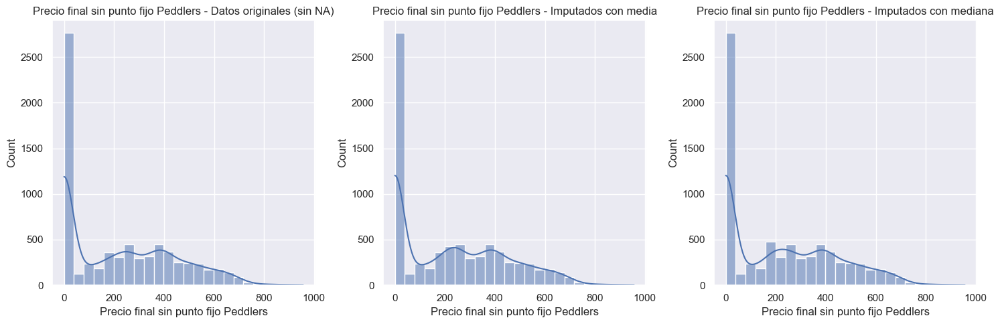

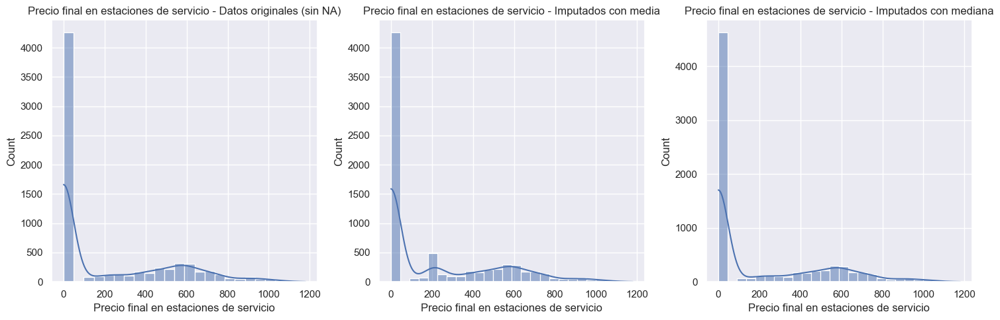

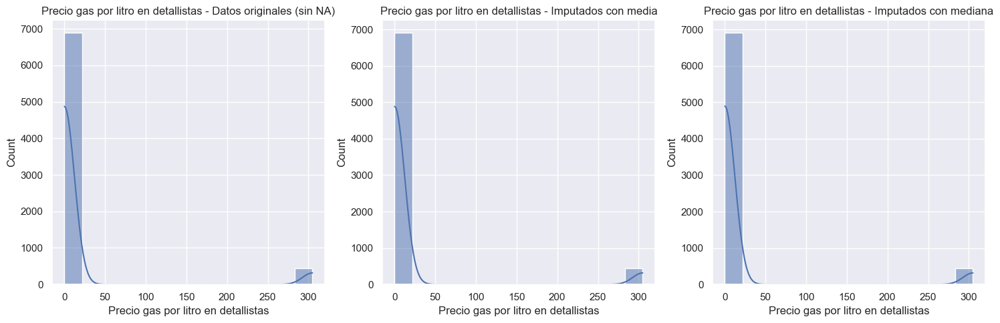

In [63]:
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Función para imputar valores numéricos
def imputar_valores_numericos(df, columnas, estrategia='mean'):
    '''Imputa valores faltantes en columnas numéricas.
    
    Parámetros:
    - df_corregido: DataFrame de pandas
    - columnas: Lista de columnas a imputar
    - estrategia: Estrategia de imputación ('mean', 'median', 'most_frequent', 'constant')
    
    Retorna:
    - DataFrame con valores imputados
    '''
    df_copia = df_corregido.copy()
    imputer = SimpleImputer(strategy=estrategia)
    df_copia[columnas] = imputer.fit_transform(df_copia[columnas])
    return df_copia

# Función para imputar valores categóricos
def imputar_valores_categoricos(df, columnas, estrategia='most_frequent'):
    '''Imputa valores faltantes en columnas categóricas.
    
    Parámetros:
    - df_corregido: DataFrame de pandas
    - columnas: Lista de columnas a imputar
    - estrategia: Estrategia de imputación ('most_frequent', 'constant')
    
    Retorna:
    - DataFrame con valores imputados
    '''
    df_copia = df_corregido.copy()
    for col in columnas:
        imputer = SimpleImputer(strategy=estrategia)
        valores = df_copia[[col]].values
        df_copia[col] = imputer.fit_transform(valores).ravel()
    return df_copia

# Función para imputar usando KNN
def imputar_knn(df, columnas, n_neighbors=5):
    '''Imputa valores faltantes usando el algoritmo de K vecinos más cercanos.
    
    Parámetros:
    - df_corregido: DataFrame de pandas
    - columnas: Lista de columnas a imputar
    - n_neighbors: Número de vecinos a considerar
    
    Retorna:
    - DataFrame con valores imputados
    '''
    df_copia = df_corregido.copy()
    imputer = KNNImputer(n_neighbors=n_neighbors)
    df_copia[columnas] = imputer.fit_transform(df_copia[columnas])
    return df_copia

# Función para imputar usando MICE (Multiple Imputation by Chained Equations)
def imputar_mice(df, columnas, max_iter=10, random_state=0):
    '''Imputa valores faltantes usando el algoritmo MICE.
    
    Parámetros:
    - df_corregido: DataFrame de pandas
    - columnas: Lista de columnas a imputar
    - max_iter: Número máximo de iteraciones
    - random_state: Semilla para reproducibilidad
    
    Retorna:
    - DataFrame con valores imputados
    '''
    df_copia = df_corregido.copy()
    imputer = IterativeImputer(max_iter=max_iter, random_state=random_state)
    df_copia[columnas] = imputer.fit_transform(df_copia[columnas])
    return df_copia

# Demostración de imputación en el dataset
# Primero identificamos las columnas numéricas y categóricas con valores nulos
columnas_numericas_nulas = df_corregido.select_dtypes(include=['float64', 'int64']).columns[
    df_corregido.select_dtypes(include=['float64', 'int64']).isnull().any()
].tolist()

columnas_categoricas_nulas = df_corregido.select_dtypes(include=['object']).columns[
    df_corregido.select_dtypes(include=['object']).isnull().any()
].tolist()

print("Columnas numéricas con valores nulos:")
print(columnas_numericas_nulas)

print("\nColumnas categóricas con valores nulos:")
print(columnas_categoricas_nulas)

# Si hay columnas numéricas con valores nulos, aplicamos diferentes métodos de imputación
if columnas_numericas_nulas:
    # Imputación con media
    df_media = imputar_valores_numericos(df_corregido, columnas_numericas_nulas, 'mean')
    print("\nImputación con media:")
    print(f"Valores nulos después de imputación: {df_media[columnas_numericas_nulas].isnull().sum().sum()}")
    
    # Imputación con mediana
    df_mediana = imputar_valores_numericos(df_corregido, columnas_numericas_nulas, 'median')
    print("\nImputación con mediana:")
    print(f"Valores nulos después de imputación: {df_mediana[columnas_numericas_nulas].isnull().sum().sum()}")
    
    # Si hay suficientes datos, también probamos KNN y MICE
    if len(df_corregido) > 10 and len(columnas_numericas_nulas) > 1:
        try:
            # Imputación con KNN
            df_knn = imputar_knn(df_corregido, columnas_numericas_nulas)
            print("\nImputación con KNN:")
            print(f"Valores nulos después de imputación: {df_knn[columnas_numericas_nulas].isnull().sum().sum()}")
            
            # Imputación con MICE
            df_mice = imputar_mice(df_corregido, columnas_numericas_nulas)
            print("\nImputación con MICE:")
            print(f"Valores nulos después de imputación: {df_mice[columnas_numericas_nulas].isnull().sum().sum()}")
        except Exception as e:
            print(f"Error al aplicar KNN o MICE: {e}")

# Si hay columnas categóricas con valores nulos, aplicamos imputación
if columnas_categoricas_nulas:
    # Imputación con valor más frecuente
    df_moda = imputar_valores_categoricos(df_corregido, columnas_categoricas_nulas)
    print("\nImputación de categóricas con valor más frecuente:")
    print(f"Valores nulos después de imputación: {df_moda[columnas_categoricas_nulas].isnull().sum().sum()}")

# Comparación de distribuciones antes y después de la imputación
if columnas_numericas_nulas:
    for col in columnas_numericas_nulas[:3]:  # Limitamos a 3 columnas para no saturar
        plt.figure(figsize=(15, 5))
        
        plt.subplot(1, 3, 1)
        sns.histplot(df_corregido[col].dropna(), kde=True)
        plt.title(f"{col} - Datos originales (sin NA)")
        
        plt.subplot(1, 3, 2)
        sns.histplot(df_media[col], kde=True)
        plt.title(f"{col} - Imputados con media")
        
        plt.subplot(1, 3, 3)
        sns.histplot(df_mediana[col], kde=True)
        plt.title(f"{col} - Imputados con mediana")
        
        plt.tight_layout()
        plt.show()

## Codificación de variables categóricas

Columnas categóricas identificadas: 4
['Fecha Publicación', 'Alcance Gaceta', 'Producto', 'Rige']

1. LABEL ENCODING
Útil para variables ordinales (con orden implícito) o binarias

Aplicando Label Encoding a 1 columnas:
  - Rige: 2 valores únicos

Distribución antes de Label Encoding:


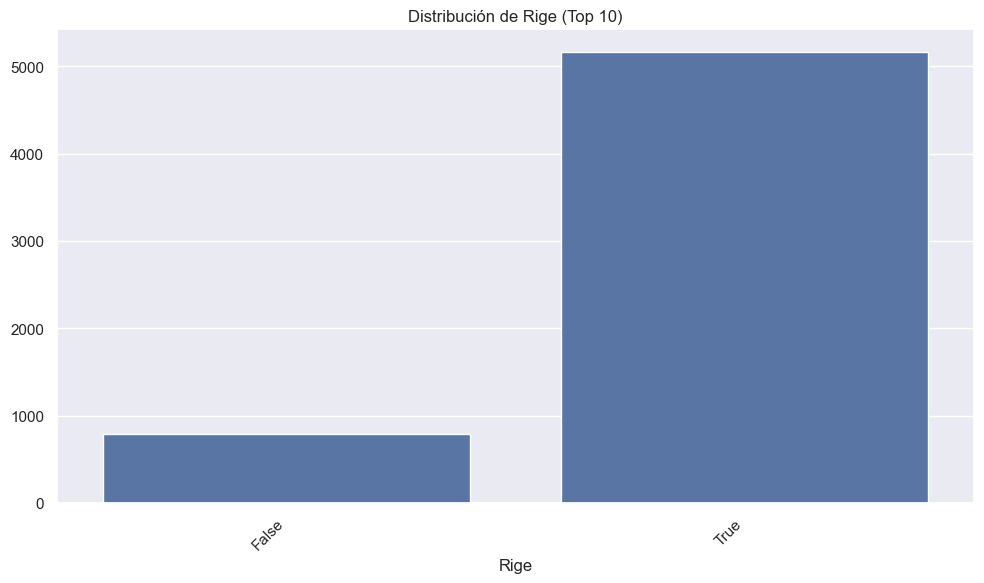


La columna 'Rige' no está presente en el DataFrame.
  - Columna 'Rige' - Convirtiendo valores a string para asegurar compatibilidad
  - Columna 'Rige' codificada como 'Rige_encoded'
    Valores: {'0.0': np.int64(0), '1.0': np.int64(1)}

Resultado después de Label Encoding:

Comparación para 'Rige':
Original:
0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: Rige, dtype: object

Codificado (Rige_encoded):
0    1
1    1
2    1
3    1
4    1
Name: Rige_encoded, dtype: int64

2. ONE-HOT ENCODING
Útil para variables categóricas nominales con pocos valores únicos
No se encontraron columnas adecuadas para One-Hot Encoding

3. TARGET ENCODING
Útil para variables categóricas con muchos valores únicos

Usando 'Gaceta' como variable objetivo para demostrar Target Encoding

Aplicando Target Encoding a 3 columnas:
  - Fecha Publicación: 389 valores únicos
  - Alcance Gaceta: 156 valores únicos
  - Producto: 68 valores únicos

Distribución antes de Target Encoding:


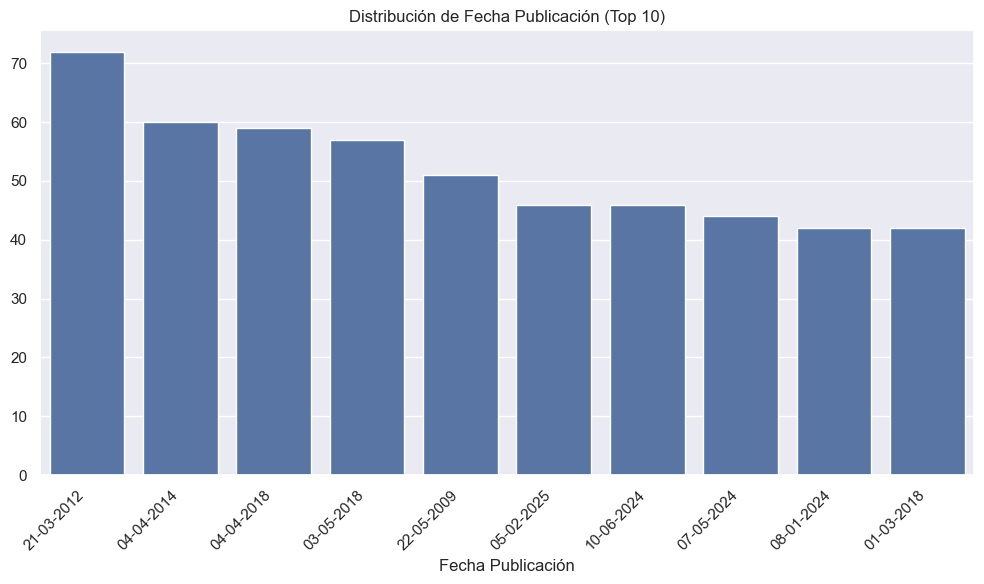

  - Columna 'Fecha Publicación' codificada como 'Fecha Publicación_target_encoded'
    Ejemplos (media del valor codificado por categoría):
Fecha Publicación
01-02-2012    77.359462
01-02-2022    70.932613
01-03-2017    82.432613
01-03-2018    47.265847
01-03-2022    80.932613
Name: Fecha Publicación_target_encoded, dtype: float64
  - Columna 'Alcance Gaceta' codificada como 'Alcance Gaceta_target_encoded'
    Ejemplos (media del valor codificado por categoría):
Alcance Gaceta
0      128.248366
1        2.934651
103    102.181067
106    116.432613
107    112.432613
Name: Alcance Gaceta_target_encoded, dtype: float64

Comparación para 'Fecha Publicación':
Original:
0    17-03-2025
1    17-03-2025
2    17-03-2025
3    17-03-2025
4    17-03-2025
Name: Fecha Publicación, dtype: object

Codificado (Fecha Publicación_target_encoded):
0    81.157227
1    81.157227
2    81.157227
3    81.157227
4    81.157227
Name: Fecha Publicación_target_encoded, dtype: float64

4. FREQUENCY ENCODING
Codific

ValueError: invalid literal for int() with base 10: '1.0'

In [ ]:
# Codificación de variables categóricas a numéricas
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import category_encoders as ce
import pandas as pd

# Hacer una copia del DataFrame limpio para trabajar con las codificaciones
df_encoded = df_corregido.copy()

# Identificar las columnas categóricas
cat_cols = df_encoded.select_dtypes(include=['object', 'category']).columns.tolist()
print(f"Columnas categóricas identificadas: {len(cat_cols)}")
print(cat_cols)

# Función para visualizar distribución de una variable categórica
def visualizar_distribucion_categorica(df_corregido, columna, top_n=10):
    '''Visualiza la distribución de valores en una columna categórica'''
    plt.figure(figsize=(10, 6))
    value_counts = df_corregido[columna].value_counts().head(top_n)
    sns.barplot(x=value_counts.index, y=value_counts.values)
    plt.title(f'Distribución de {columna} (Top {top_n})')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    return value_counts

# 1. Label Encoding (para variables ordinales o binarias)
print("\n1. LABEL ENCODING")
print("Útil para variables ordinales (con orden implícito) o binarias")

# Función para aplicar Label Encoding
def aplicar_label_encoding(df_corregido, columnas):
    '''Aplica Label Encoding a las columnas especificadas'''
    df_result = df_corregido.copy()
    encoders = {}
    
    for col in columnas:
        le = LabelEncoder()
        # Asegurarse de que no hay valores nulos
        if df_result[col].isnull().sum() > 0:
            print(f"  - Columna '{col}' contiene valores nulos. Rellenando con 'DESCONOCIDO'")
            df_result[col] = df_result[col].fillna('DESCONOCIDO')
        
            # Si hay algún valor no contemplado, lo asignamos como 1 también
            
            print("Valores únicos después de la codificación en 'Rige:")
            print(df_encoded['Rige'].value_counts())
        else:
            print("\nLa columna 'Rige' no está presente en el DataFrame.")

        
        # Convertir todos los valores a string para evitar problemas con tipos mixtos (bool, str)
        print(f"  - Columna '{col}' - Convirtiendo valores a string para asegurar compatibilidad")
        df_result[col] = df_result[col].astype(str)
        
        # Aplicar el encoder
        df_result[col + '_encoded'] = le.fit_transform(df_result[col])
        encoders[col] = le
        
        # Mostrar mapeo de valores
        mapeo = dict(zip(le.classes_, le.transform(le.classes_)))
        print(f"  - Columna '{col}' codificada como '{col}_encoded'")
        print(f"    Valores: {mapeo}")
    
    return df_result, encoders

# Seleccionar columnas para Label Encoding (comúnmente columnas binarias o con orden implícito)
# Por ejemplo: 'Rige' (si/no), 'Unidad' (tipos de unidades), etc.
label_cols = [col for col in cat_cols if df_encoded[col].nunique() < 5 or 'tipo' in col.lower() or 'unidad' in col.lower() or 'rige' in col.lower()]

if label_cols:
    print(f"\nAplicando Label Encoding a {len(label_cols)} columnas:")
    for col in label_cols:
        print(f"  - {col}: {df_encoded[col].nunique()} valores únicos")
        
    # Visualizar algunas distribuciones antes de la codificación
    if len(label_cols) > 0:
        print("\nDistribución antes de Label Encoding:")
        visualizar_distribucion_categorica(df_encoded, label_cols[0])

    if 'Rige' in df_encoded.columns:
        df_encoded['Rige'] = df_encoded['Rige'].astype(str).str.strip().str.upper()
        df_encoded['Rige'] = df_encoded['Rige'].map({
            'TRUE': 1,
            'FALSE': 0
        }).fillna(1)
        
    # Aplicar Label Encoding
    df_encoded, label_encoders = aplicar_label_encoding(df_encoded, label_cols)
    
    # Mostrar resultado
    print("\nResultado después de Label Encoding:")
    if len(label_cols) > 0:
        col = label_cols[0]
        print(f"\nComparación para '{col}':")
        print(f"Original:\n{df_encoded[col].head()}")
        print(f"\nCodificado ({col}_encoded):\n{df_encoded[col+'_encoded'].head()}")
else:
    print("No se encontraron columnas adecuadas para Label Encoding")

# 2. One-Hot Encoding (para variables categóricas nominales con pocos valores únicos)
print("\n2. ONE-HOT ENCODING")
print("Útil para variables categóricas nominales con pocos valores únicos")

# Función para aplicar One-Hot Encoding
def aplicar_onehot_encoding(df_corregido, columnas, max_categorias=15):
    '''Aplica One-Hot Encoding a las columnas especificadas'''
    df_result = df_corregido.copy()
    
    for col in columnas:
        # Verificar si la columna tiene demasiadas categorías
        if df_result[col].nunique() > max_categorias:
            print(f"  - Columna '{col}' tiene {df_result[col].nunique()} valores únicos, excede el máximo ({max_categorias})")
            continue
            
        # Aplicar get_dummies (OneHotEncoding de pandas)
        dummies = pd.get_dummies(df_result[col], prefix=col, dummy_na=df_result[col].isnull().any())
        
        # Unir los dummies al dataframe
        df_result = pd.concat([df_result, dummies], axis=1)
        
        print(f"  - Columna '{col}' codificada en {dummies.shape[1]} columnas dummy")
        print(f"    Nuevas columnas: {dummies.columns.tolist()}")
    
    return df_result

# Seleccionar columnas para One-Hot Encoding
# Excluimos las columnas ya codificadas con Label Encoding
onehot_cols = [col for col in cat_cols 
               if col not in label_cols 
               and df_encoded[col].nunique() <= 15]  # Limitamos a columnas con máximo 15 valores únicos

if onehot_cols:
    print(f"\nAplicando One-Hot Encoding a {len(onehot_cols)} columnas:")
    for col in onehot_cols:
        print(f"  - {col}: {df_encoded[col].nunique()} valores únicos")
        
    # Visualizar una distribución antes de la codificación
    if len(onehot_cols) > 0:
        print("\nDistribución antes de One-Hot Encoding:")
        visualizar_distribucion_categorica(df_encoded, onehot_cols[0])
    
    # Aplicar One-Hot Encoding
    df_encoded = aplicar_onehot_encoding(df_encoded, onehot_cols)
    
    # Mostrar resultado
    print("\nDimensiones después de One-Hot Encoding:")
    print(f"- Filas: {df_encoded.shape[0]}")
    print(f"- Columnas: {df_encoded.shape[1]}")
else:
    print("No se encontraron columnas adecuadas para One-Hot Encoding")

# 3. Target Encoding (para variables categóricas con muchos valores únicos)
print("\n3. TARGET ENCODING")
print("Útil para variables categóricas con muchos valores únicos")

# Para este método, necesitamos una variable objetivo (target)
# Si no tenemos una variable objetivo clara, podemos seleccionar una variable numérica 
# como proxy para demostrar el método

# Identificar variables numéricas que podrían servir como objetivo
num_cols = df_encoded.select_dtypes(include=['int64', 'float64', 'Int64']).columns.tolist()

if num_cols and len(cat_cols) > 0:
    # Seleccionar una variable numérica como objetivo para la demostración
    target_col = num_cols[0]
    print(f"\nUsando '{target_col}' como variable objetivo para demostrar Target Encoding")
    
    # Seleccionar columnas para Target Encoding (las que tienen demasiados valores únicos para One-Hot)
    target_cols = [col for col in cat_cols
                  if 'resoluc' not in col.lower() and 'resoluci' not in col.lower() 
                  if col not in label_cols 
                  and col not in onehot_cols
                  and df_encoded[col].nunique() > 15]  # Columnas con más de 15 valores únicos
    
    if target_cols:
        print(f"\nAplicando Target Encoding a {len(target_cols)} columnas:")
        for col in target_cols:
            print(f"  - {col}: {df_encoded[col].nunique()} valores únicos")
        
        # Visualizar una distribución antes de la codificación
        if len(target_cols) > 0:
            print("\nDistribución antes de Target Encoding:")
            visualizar_distribucion_categorica(df_encoded, target_cols[0])
        
        # Función para aplicar Target Encoding
        def aplicar_target_encoding(df_corregido, columnas, target_col):
            '''Aplica Target Encoding a las columnas especificadas'''
            df_result = df_corregido.copy()
            
            for col in columnas:
                # Crear un encoder para cada columna
                encoder = ce.TargetEncoder(cols=[col])
                
                # Verificar si hay valores nulos en la columna objetivo
                if df_result[target_col].isnull().sum() > 0:
                    print(f"  - La columna objetivo '{target_col}' contiene valores nulos. Usando solo filas no nulas.")
                    idx_validos = ~df_result[target_col].isnull()
                    # Ajustar el encoder solo con datos válidos
                    encoder.fit(df_result.loc[idx_validos, col], df_result.loc[idx_validos, target_col])
                    # Transformar todos los datos
                    df_result[col + '_target_encoded'] = encoder.transform(df_result[col])
                else:
                    # Ajustar y transformar
                    df_result[col + '_target_encoded'] = encoder.fit_transform(df_result[col], df_result[target_col])
                
                print(f"  - Columna '{col}' codificada como '{col}_target_encoded'")
                
                # Mostrar algunos valores de ejemplo
                ejemplos = df_result.groupby(col)[col + '_target_encoded'].mean().head(5)
                print(f"    Ejemplos (media del valor codificado por categoría):")
                print(ejemplos)
            
            return df_result
            
        # Aplicar Target Encoding
        df_encoded = aplicar_target_encoding(df_encoded, target_cols[:2], target_col)  # Limitamos a 2 columnas para el ejemplo
        
        # Mostrar resultado
        if len(target_cols) > 0:
            col = target_cols[0]
            print(f"\nComparación para '{col}':")
            print(f"Original:\n{df_encoded[col].head()}")
            print(f"\nCodificado ({col}_target_encoded):\n{df_encoded[col+'_target_encoded'].head()}")
    else:
        print("No se encontraron columnas adecuadas para Target Encoding")
else:
    print("No se pueden aplicar métodos basados en Target porque no hay columnas numéricas disponibles")

# 4. Frequency Encoding
print("\n4. FREQUENCY ENCODING")
print("Codifica cada categoría con su frecuencia relativa o absoluta")

# Función para aplicar Frequency Encoding
def aplicar_frequency_encoding(df_corregido, columnas, tipo='relativa'):
    '''Aplica Frequency Encoding a las columnas especificadas'''
    df_result = df_corregido.copy()
    
    for col in columnas:
        # Calcular frecuencias
        freq = df_result[col].value_counts()
        
        if tipo == 'relativa':
            # Frecuencia relativa (entre 0 y 1)
            freq = freq / len(df_result)
            suffix = '_freq_rel'
        else:
            # Frecuencia absoluta
            suffix = '_freq_abs'
        
        # Crear mapeo de valores a frecuencias
        freq_mapping = freq.to_dict()
        
        # Aplicar el mapeo a la columna original
        df_result[col + suffix] = df_result[col].map(freq_mapping)
        
        print(f"  - Columna '{col}' codificada como '{col}{suffix}'")
        print(f"    Top 5 categorías por frecuencia:")
        print(freq.head(5))
    
    return df_result

# Seleccionar algunas columnas para Frequency Encoding
# Podemos usar columnas que ya usamos para otros métodos, para compararlos
freq_cols = []
if label_cols:
    freq_cols.extend(label_cols[:1])  # Tomar una columna de label encoding
if onehot_cols:
    freq_cols.extend(onehot_cols[:1])  # Tomar una columna de one-hot encoding

if len(cat_cols) > 0 and not freq_cols:
    # Si no tenemos columnas de otros métodos, tomar algunas categóricas
    freq_cols = cat_cols[:2]  # Limitar a 2 columnas para el ejemplo

if freq_cols:
    print(f"\nAplicando Frequency Encoding a {len(freq_cols)} columnas:")
    for col in freq_cols:
        print(f"  - {col}: {df_encoded[col].nunique()} valores únicos")
    
    # Aplicar Frequency Encoding
    df_encoded = aplicar_frequency_encoding(df_encoded, freq_cols)
    
    # Mostrar resultado
    col = freq_cols[0]
    print(f"\nComparación para '{col}':")
    print(f"Original:\n{df_encoded[col].head()}")
    print(f"\nCodificado ({col}_freq_rel):\n{df_encoded[col+'_freq_rel'].head()}")
else:
    print("No se encontraron columnas adecuadas para Frequency Encoding")

# Resumen de las transformaciones
print("\n-------------- RESUMEN DE CODIFICACIONES --------------")
print(f"Dimensiones originales de df: {df_corregido.shape}")
print(f"Dimensiones después de todas las codificaciones: {df_encoded.shape}")

# Revisar los tipos de datos después de las codificaciones
print("\nTipos de datos después de las codificaciones:")
print(df_encoded.dtypes.value_counts())

if 'Rige_encoded' in df_encoded.columns:
    df_encoded = df_encoded.drop(columns=['Rige_encoded'])
    print("\nColumna 'Rige_encoded' eliminada.")

# Asegurarse de que 'Rige' sea de tipo entero
if 'Rige' in df_encoded.columns:
    df_encoded['Rige'] = pd.to_numeric(df_encoded['Rige'], errors='coerce').fillna(1).astype(int)
    print("Columna 'Rige' convertida a tipo entero (int).")

# Guardar el dataframe codificado
if 'df_encoded' in locals():
    print("\nEl DataFrame con todas las codificaciones está disponible como 'df_encoded'")
    
    # Ejemplo de las primeras filas
    print("\nPrimeras filas del DataFrame codificado:")
    display(df_encoded.head())
    
    # Guardar el DataFrame con las codificaciones al exportar
    # Esto se incluye en la sección de exportación


## Normalización y Estandarización de Variables Numéricas

Columnas numéricas a normalizar/estandarizar: 25
['Gaceta', 'Tipo de Cambio', 'Precio Referencia Internacional', 'Precio Referencia Internacional en colones', 'Otros Ingresos Prorrateados', 'Asignación Subsidio Pescadores', 'Asignación subsidio Política Sectorial', 'Subsidio Pescadores', 'Subsidio Política Sectorial', 'Diferencial de precios', 'Impuesto Único', 'Canon', 'Margen de operación de Recope', 'Rendimiento sobre Base Tarifaria', 'Precio en terminal sin impuesto', 'Precio en terminal con impuesto', 'Precio final sin punto fijo Peddlers', 'Margen Estaciones Terrestres', 'Margen Estaciones Aéreas', 'Flete estaciones de servicio', 'Margen Envasador', 'Precio final en estaciones de servicio', 'Margen Distribuidor y Agencias', 'Margen Detallista', 'Precio gas por litro en detallistas']

1. Normalización MinMax (rango 0-1)
Estadísticas después de la normalización MinMax:
        Gaceta  Tipo de Cambio  Precio Referencia Internacional  \
count  7353.00         7353.00                 

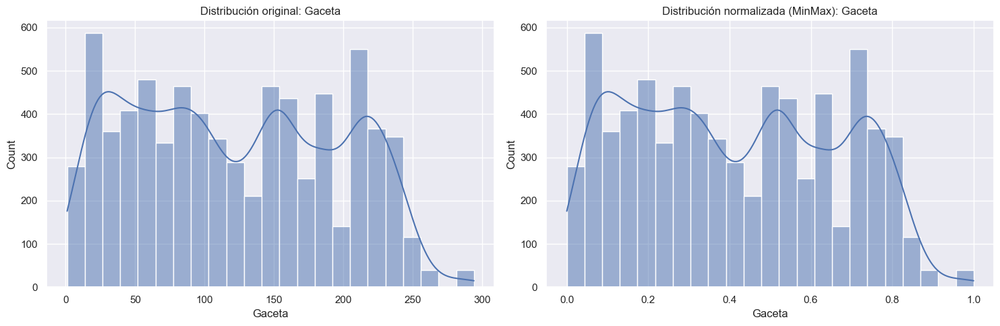

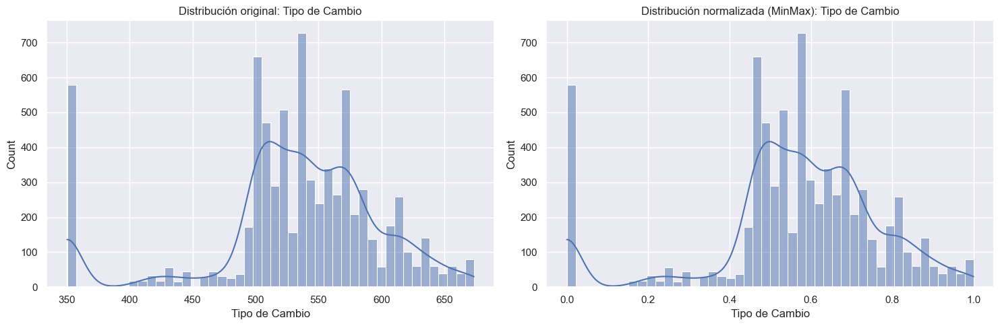

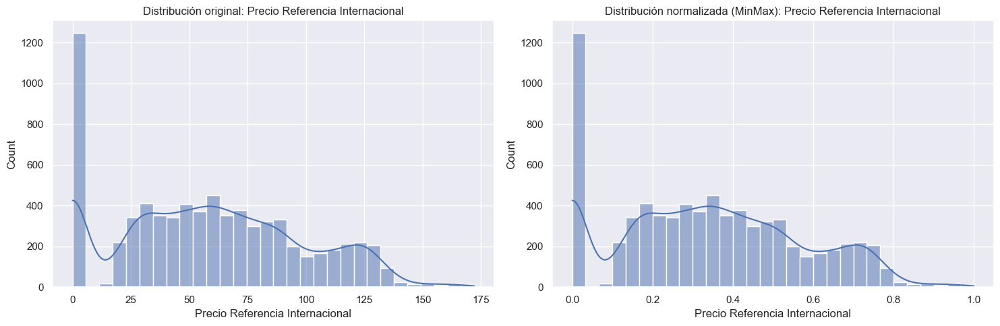


2. Estandarización Z-score (media 0, desviación estándar 1)
Estadísticas después de la estandarización:
        Gaceta  Tipo de Cambio  Precio Referencia Internacional  \
count  7353.00         7353.00                          7353.00   
mean      0.00            0.00                            -0.00   
std       1.00            1.00                             1.00   
min      -1.65           -2.57                            -1.46   
25%      -0.87           -0.38                            -0.74   
50%      -0.04            0.07                            -0.03   
75%       0.87            0.59                             0.70   
max       2.35            2.00                             2.85   

       Precio Referencia Internacional en colones  \
count                                     7353.00   
mean                                         0.00   
std                                          1.00   
min                                         -1.42   
25%                       

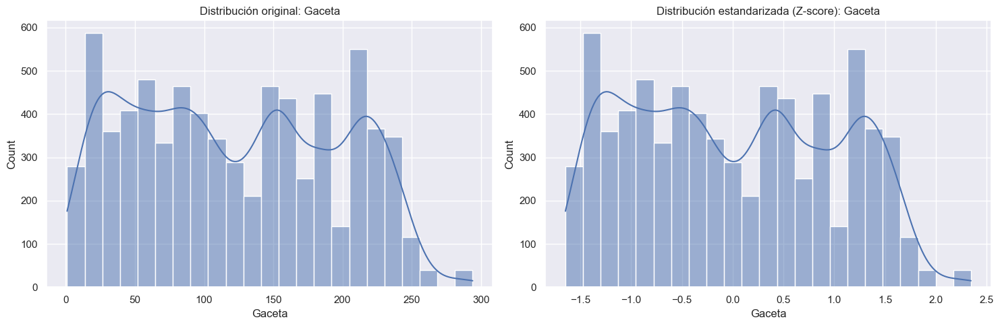

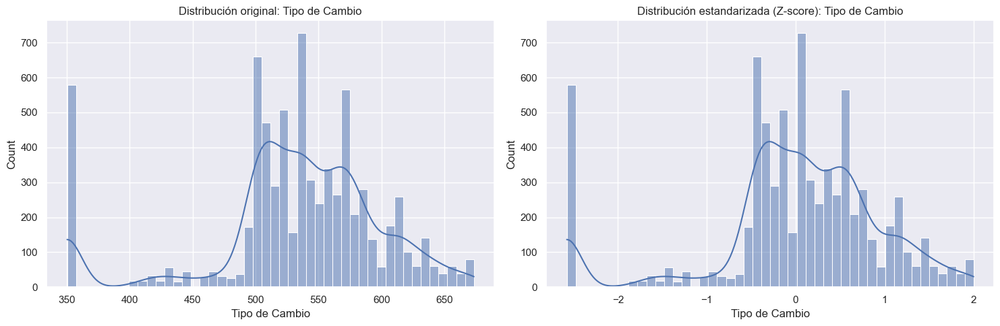

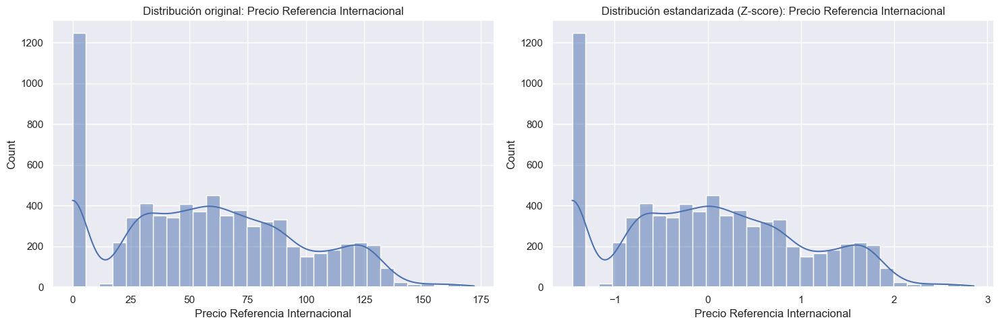


3. Robust Scaling (basado en cuantiles, más robusto a outliers)
Estadísticas después del Robust Scaling:
        Gaceta  Tipo de Cambio  Precio Referencia Internacional  \
count  7353.00         7353.00                          7353.00   
mean      0.02           -0.07                             0.02   
std       0.57            1.03                             0.69   
min      -0.92           -2.73                            -0.99   
25%      -0.48           -0.47                            -0.49   
50%       0.00            0.00                             0.00   
75%       0.52            0.53                             0.51   
max       1.37            2.00                             2.00   

       Precio Referencia Internacional en colones  \
count                                     7353.00   
mean                                        -0.01   
std                                          0.62   
min                                         -0.88   
25%                      

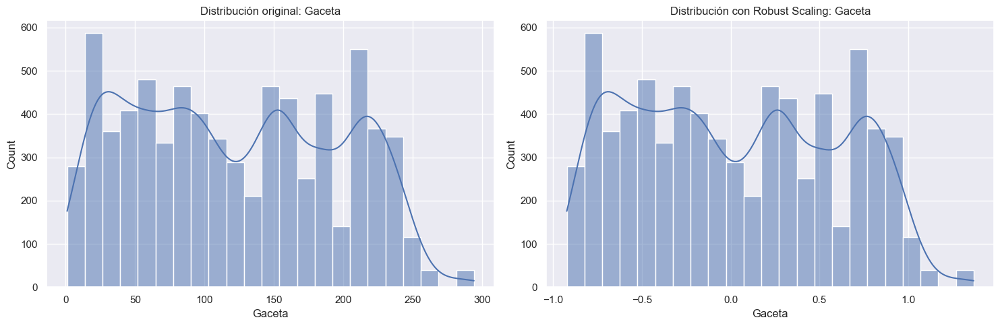

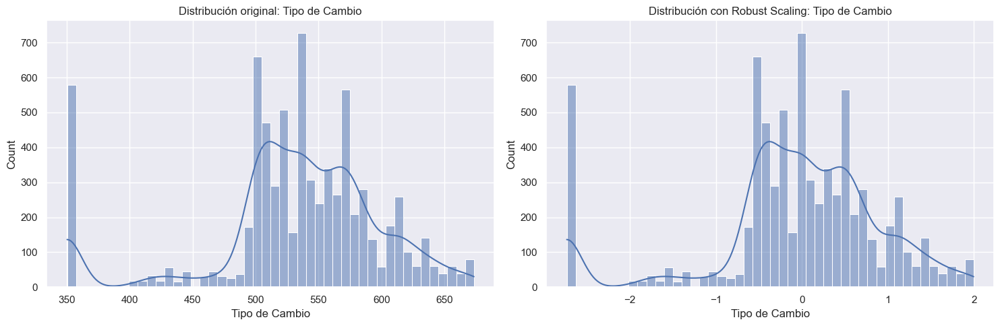

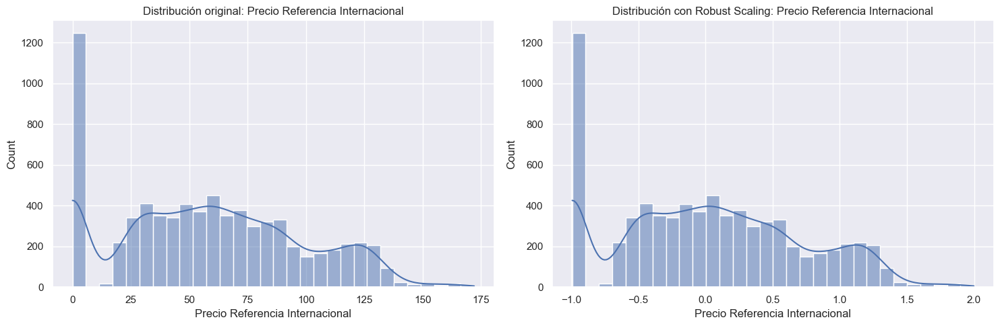


4. MaxAbs Scaling (escala por el máximo absoluto, preserva el signo)
Estadísticas después del MaxAbs Scaling:
        Gaceta  Tipo de Cambio  Precio Referencia Internacional  \
count  7353.00         7353.00                          7353.00   
mean      0.41            0.79                             0.34   
std       0.25            0.10                             0.23   
min       0.00            0.52                             0.00   
25%       0.20            0.75                             0.17   
50%       0.40            0.80                             0.33   
75%       0.63            0.85                             0.50   
max       1.00            1.00                             1.00   

       Precio Referencia Internacional en colones  \
count                                     7353.00   
mean                                         0.31   
std                                          0.22   
min                                          0.00   
25%                 

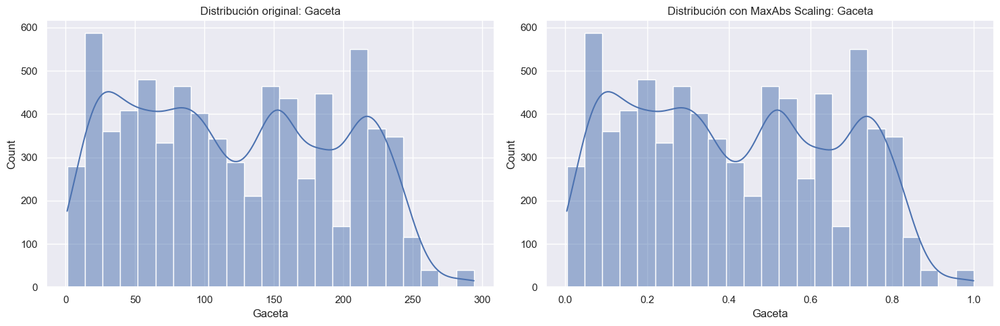

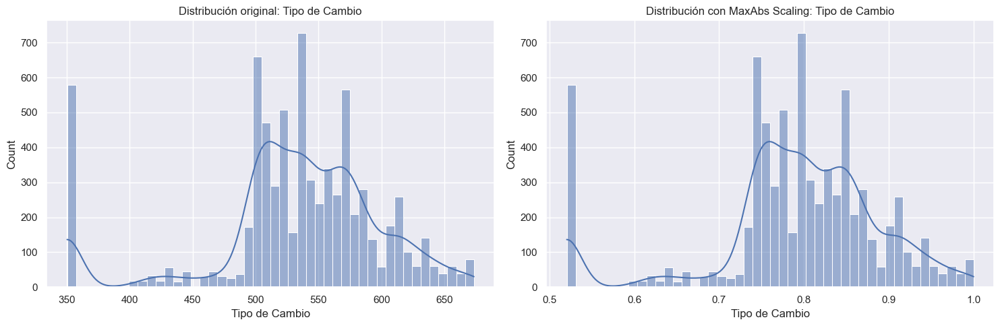

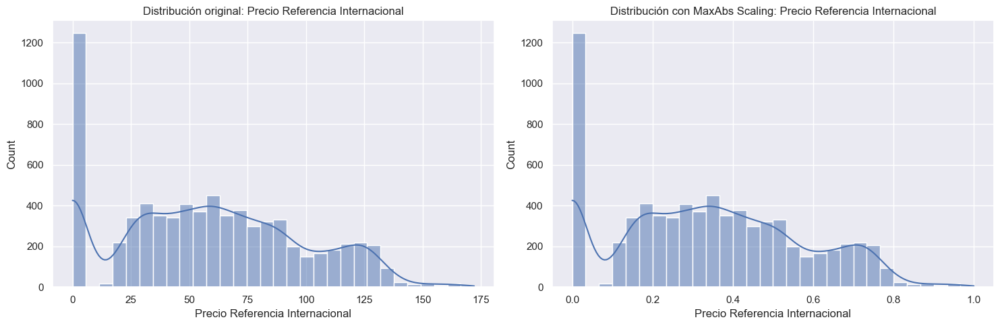

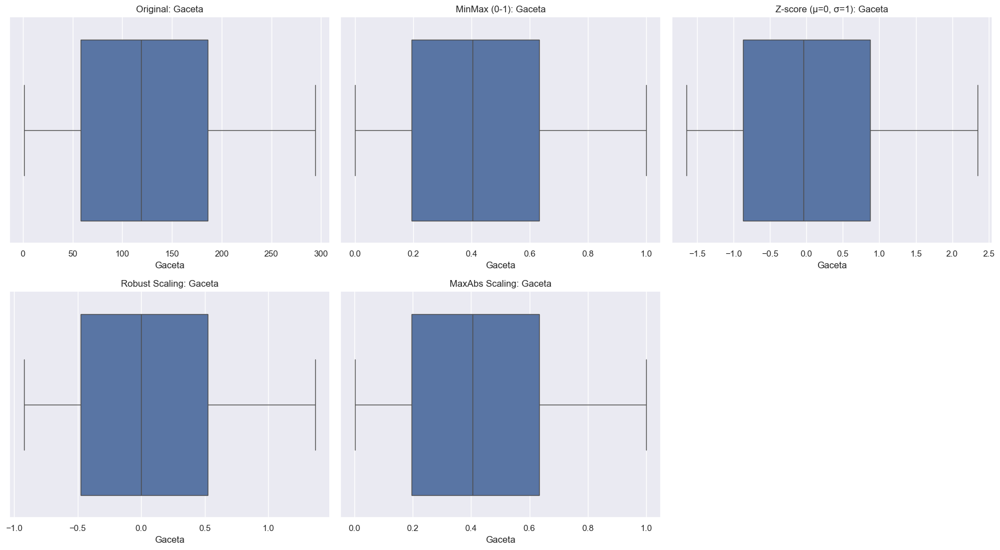


----------- RESUMEN DE ESCALADOS -----------
Dimensiones originales: (7353, 33)
Dimensiones después de escalado: (7353, 33) (todas iguales)

Cada método de escalado tiene sus ventajas:
- MinMax: útil cuando necesitamos valores acotados entre 0 y 1
- Z-score: útil cuando asumimos distribución normal y queremos comparar variables con diferentes unidades
- Robust: útil cuando tenemos outliers que podrían afectar la escala
- MaxAbs: útil cuando queremos preservar el signo y la esparsidad de los datos

Los DataFrames con diferentes escalados están disponibles:
- df_minmax: normalización en rango [0,1]
- df_standard: estandarización (μ=0, σ=1)
- df_robust: robust scaling basado en cuantiles
- df_maxabs: escalado por máximo absoluto

Estos DataFrames se incluirán en las opciones de exportación


In [ ]:
# Normalización y estandarización de variables numéricas
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, MaxAbsScaler

# Crear una copia del DataFrame para no afectar las versiones anteriores
# Usamos df_encoded si existe (con las variables categóricas codificadas), o df_corregido si no
df_scaled = df_encoded.copy() if 'df_encoded' in locals() else df_corregido.copy()

# Identificar columnas numéricas para normalizar/estandarizar
# Excluimos columnas que ya son dummies (0/1) o que tienen '_encoded' en su nombre
num_cols = df_scaled.select_dtypes(include=['int64', 'float64', 'Int64']).columns.tolist()
cols_to_scale = [col for col in num_cols 
                if not (col.endswith('_encoded') or 
                        col.endswith('_target_encoded') or 
                        col.endswith('_freq_rel') or
                        col.endswith('_freq_abs') or
                        set(df_scaled[col].dropna().unique()).issubset({0, 1}))]

print(f"Columnas numéricas a normalizar/estandarizar: {len(cols_to_scale)}")
print(cols_to_scale)

# Verificar que hay columnas para escalar
if not cols_to_scale:
    print("No se encontraron columnas numéricas para normalizar/estandarizar.")
else:
    # 1. Normalización MinMax (rango 0-1)
    # Crear un nuevo DataFrame para cada tipo de escalado
    df_minmax = df_scaled.copy()
    
    # Inicializar el scaler
    minmax_scaler = MinMaxScaler()
    
    # Aplicar la normalización a las columnas seleccionadas
    df_minmax[cols_to_scale] = minmax_scaler.fit_transform(df_minmax[cols_to_scale])
    
    # Mostrar estadísticas después de la normalización
    print("\n1. Normalización MinMax (rango 0-1)")
    print("Estadísticas después de la normalización MinMax:")
    print(df_minmax[cols_to_scale].describe().round(2))
    
    # Visualizar la distribución antes y después para algunas columnas
    if len(cols_to_scale) > 0:
        sample_cols = cols_to_scale[:min(3, len(cols_to_scale))]  # Tomar hasta 3 columnas para visualizar
        
        for col in sample_cols:
            plt.figure(figsize=(15, 5))
            
            # Distribución original
            plt.subplot(1, 2, 1)
            sns.histplot(df_scaled[col].dropna(), kde=True)
            plt.title(f"Distribución original: {col}")
            
            # Distribución normalizada
            plt.subplot(1, 2, 2)
            sns.histplot(df_minmax[col].dropna(), kde=True)
            plt.title(f"Distribución normalizada (MinMax): {col}")
            
            plt.tight_layout()
            plt.show()
    
    # 2. Estandarización Z-score (media 0, desviación estándar 1)
    df_standard = df_scaled.copy()
    
    # Inicializar el scaler
    standard_scaler = StandardScaler()
    
    # Aplicar la estandarización a las columnas seleccionadas
    df_standard[cols_to_scale] = standard_scaler.fit_transform(df_standard[cols_to_scale])
    
    # Mostrar estadísticas después de la estandarización
    print("\n2. Estandarización Z-score (media 0, desviación estándar 1)")
    print("Estadísticas después de la estandarización:")
    print(df_standard[cols_to_scale].describe().round(2))
    
    # Visualizar la distribución para algunas columnas
    for col in sample_cols:
        plt.figure(figsize=(15, 5))
        
        # Distribución original
        plt.subplot(1, 2, 1)
        sns.histplot(df_scaled[col].dropna(), kde=True)
        plt.title(f"Distribución original: {col}")
        
        # Distribución estandarizada
        plt.subplot(1, 2, 2)
        sns.histplot(df_standard[col].dropna(), kde=True)
        plt.title(f"Distribución estandarizada (Z-score): {col}")
        
        plt.tight_layout()
        plt.show()
    
    # 3. Robust Scaling (basado en cuantiles, más robusto a outliers)
    df_robust = df_scaled.copy()
    
    # Inicializar el scaler
    robust_scaler = RobustScaler()
    
    # Aplicar el robust scaling a las columnas seleccionadas
    df_robust[cols_to_scale] = robust_scaler.fit_transform(df_robust[cols_to_scale])
    
    # Mostrar estadísticas después del robust scaling
    print("\n3. Robust Scaling (basado en cuantiles, más robusto a outliers)")
    print("Estadísticas después del Robust Scaling:")
    print(df_robust[cols_to_scale].describe().round(2))
    
    # Visualizar la distribución para algunas columnas
    for col in sample_cols:
        plt.figure(figsize=(15, 5))
        
        # Distribución original
        plt.subplot(1, 2, 1)
        sns.histplot(df_scaled[col].dropna(), kde=True)
        plt.title(f"Distribución original: {col}")
        
        # Distribución con robust scaling
        plt.subplot(1, 2, 2)
        sns.histplot(df_robust[col].dropna(), kde=True)
        plt.title(f"Distribución con Robust Scaling: {col}")
        
        plt.tight_layout()
        plt.show()
    
    # 4. MaxAbs Scaling (escala por el máximo absoluto, preserva el signo)
    df_maxabs = df_scaled.copy()
    
    # Inicializar el scaler
    maxabs_scaler = MaxAbsScaler()
    
    # Aplicar el maxabs scaling a las columnas seleccionadas
    df_maxabs[cols_to_scale] = maxabs_scaler.fit_transform(df_maxabs[cols_to_scale])
    
    # Mostrar estadísticas después del maxabs scaling
    print("\n4. MaxAbs Scaling (escala por el máximo absoluto, preserva el signo)")
    print("Estadísticas después del MaxAbs Scaling:")
    print(df_maxabs[cols_to_scale].describe().round(2))
    
    # Visualizar la distribución para algunas columnas
    for col in sample_cols:
        plt.figure(figsize=(15, 5))
        
        # Distribución original
        plt.subplot(1, 2, 1)
        sns.histplot(df_scaled[col].dropna(), kde=True)
        plt.title(f"Distribución original: {col}")
        
        # Distribución con maxabs scaling
        plt.subplot(1, 2, 2)
        sns.histplot(df_maxabs[col].dropna(), kde=True)
        plt.title(f"Distribución con MaxAbs Scaling: {col}")
        
        plt.tight_layout()
        plt.show()
    
    # Comparación de los métodos para una columna de ejemplo
    if len(sample_cols) > 0:
        col = sample_cols[0]  # Tomar la primera columna como ejemplo
        plt.figure(figsize=(18, 10))
        
        # Original
        plt.subplot(2, 3, 1)
        sns.boxplot(x=df_scaled[col].dropna())
        plt.title(f"Original: {col}")
        
        # MinMax
        plt.subplot(2, 3, 2)
        sns.boxplot(x=df_minmax[col].dropna())
        plt.title(f"MinMax (0-1): {col}")
        
        # Z-score
        plt.subplot(2, 3, 3)
        sns.boxplot(x=df_standard[col].dropna())
        plt.title(f"Z-score (μ=0, σ=1): {col}")
        
        # Robust
        plt.subplot(2, 3, 4)
        sns.boxplot(x=df_robust[col].dropna())
        plt.title(f"Robust Scaling: {col}")
        
        # MaxAbs
        plt.subplot(2, 3, 5)
        sns.boxplot(x=df_maxabs[col].dropna())
        plt.title(f"MaxAbs Scaling: {col}")
        
        plt.tight_layout()
        plt.show()
    
    # Resumen de los DataFrames con diferentes escalados
    print("\n----------- RESUMEN DE ESCALADOS -----------")
    print(f"Dimensiones originales: {df_scaled.shape}")
    print(f"Dimensiones después de escalado: {df_minmax.shape} (todas iguales)")
    print("\nCada método de escalado tiene sus ventajas:")
    print("- MinMax: útil cuando necesitamos valores acotados entre 0 y 1")
    print("- Z-score: útil cuando asumimos distribución normal y queremos comparar variables con diferentes unidades")
    print("- Robust: útil cuando tenemos outliers que podrían afectar la escala")
    print("- MaxAbs: útil cuando queremos preservar el signo y la esparsidad de los datos")
    
    # Guardar los DataFrames escalados
    print("\nLos DataFrames con diferentes escalados están disponibles:")
    print("- df_minmax: normalización en rango [0,1]")
    print("- df_standard: estandarización (μ=0, σ=1)")
    print("- df_robust: robust scaling basado en cuantiles")
    print("- df_maxabs: escalado por máximo absoluto")
    
    # Actualizar la sección de exportación para incluir estos DataFrames
    print("\nEstos DataFrames se incluirán en las opciones de exportación")


## Correlación de las variables

Analizando correlaciones entre 25 variables numéricas

1. MATRIZ DE CORRELACIÓN DE PEARSON
Muestra correlaciones lineales entre variables (-1 a 1)

Matriz de correlación:
                                            Gaceta  Tipo de Cambio  \
Gaceta                                        1.00            0.06   
Tipo de Cambio                                0.06            1.00   
Precio Referencia Internacional               0.06            0.10   
Precio Referencia Internacional en colones    0.06            0.22   
Otros Ingresos Prorrateados                  -0.01           -0.45   
Asignación Subsidio Pescadores               -0.01            0.32   
Asignación subsidio Política Sectorial       -0.02            0.26   
Subsidio Pescadores                           0.01           -0.10   
Subsidio Política Sectorial                   0.02           -0.25   
Diferencial de precios                        0.02           -0.45   
Impuesto Único                                0.00         

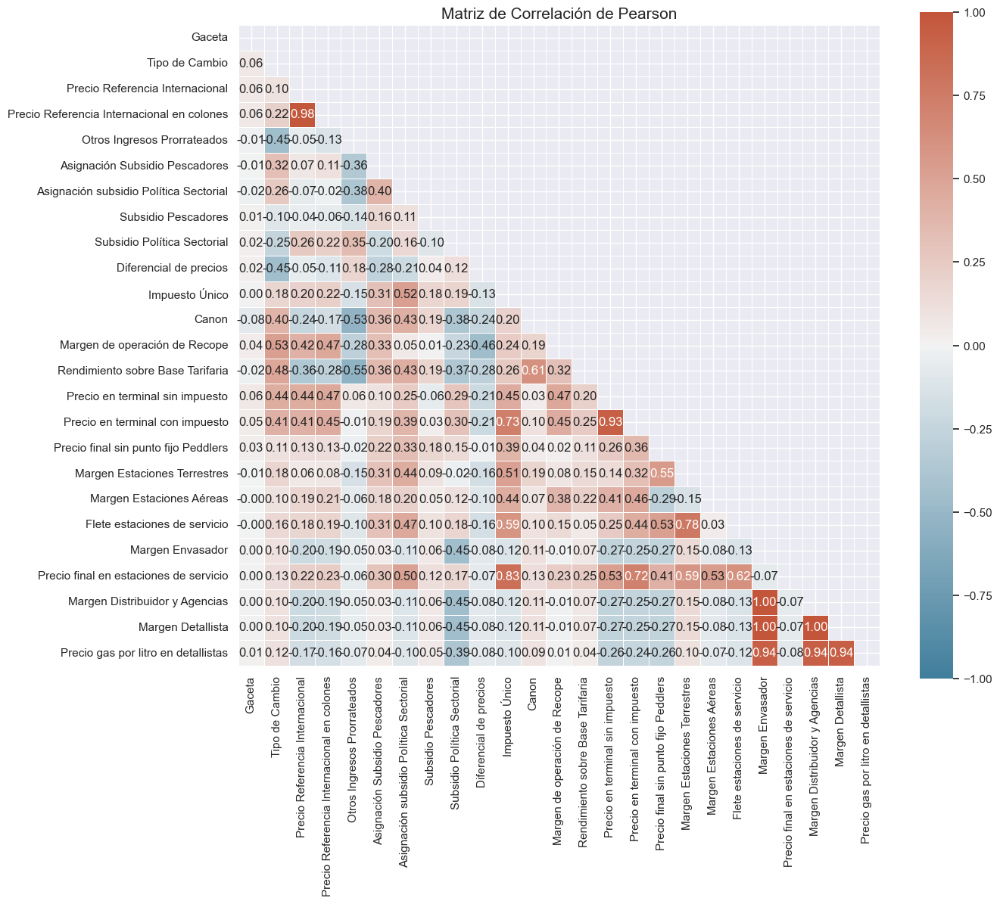


2. CORRELACIONES MÁS FUERTES

Top 10 correlaciones más fuertes:
                                     Variable 1  \
595                           Margen Detallista   
523                            Margen Envasador   
522                            Margen Envasador   
570              Margen Distribuidor y Agencias   
573              Margen Distribuidor y Agencias   
597                           Margen Detallista   
53              Precio Referencia Internacional   
77   Precio Referencia Internacional en colones   
599                           Margen Detallista   
623         Precio gas por litro en detallistas   

                                     Variable 2  Correlación  Abs_Corr  
595                            Margen Envasador     1.000000  1.000000  
523                           Margen Detallista     1.000000  1.000000  
522              Margen Distribuidor y Agencias     1.000000  1.000000  
570                            Margen Envasador     1.000000  1.000000  
573     

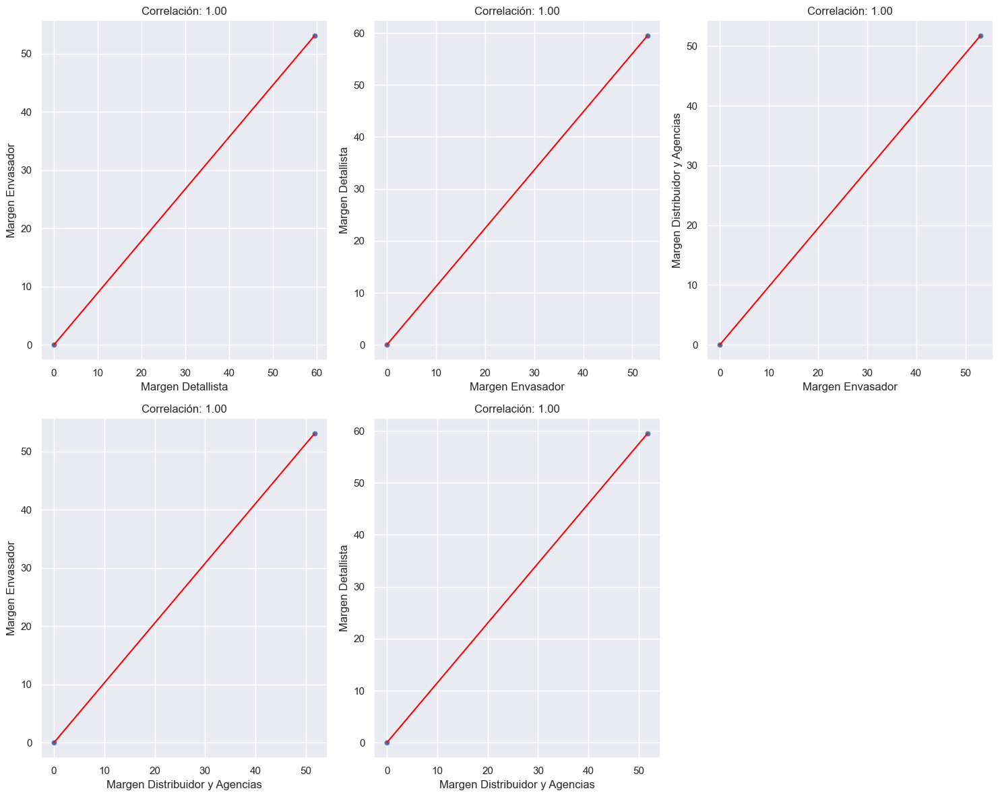


3. ANÁLISIS DE CORRELACIÓN POR GRUPOS

Agrupaciones identificadas:

4. MAPA DE CALOR INTERACTIVO



5. CORRELACIÓN DE SPEARMAN
Mide correlaciones monótonas, útil cuando la relación no es lineal

Comparación de diferencias significativas entre correlaciones Pearson y Spearman:
                           Variable 1                        Variable 2  \
288                             Canon  Rendimiento sobre Base Tarifaria   
336  Rendimiento sobre Base Tarifaria                             Canon   
39                     Tipo de Cambio   Precio en terminal sin impuesto   
351   Precio en terminal sin impuesto                    Tipo de Cambio   
138    Asignación Subsidio Pescadores  Rendimiento sobre Base Tarifaria   
330  Rendimiento sobre Base Tarifaria    Asignación Subsidio Pescadores   
276                             Canon                    Tipo de Cambio   
36                     Tipo de Cambio                             Canon   
37                     Tipo de Cambio     Margen de operación de Recope   
301     Margen de operación de Recope                    Tipo de Cambio 

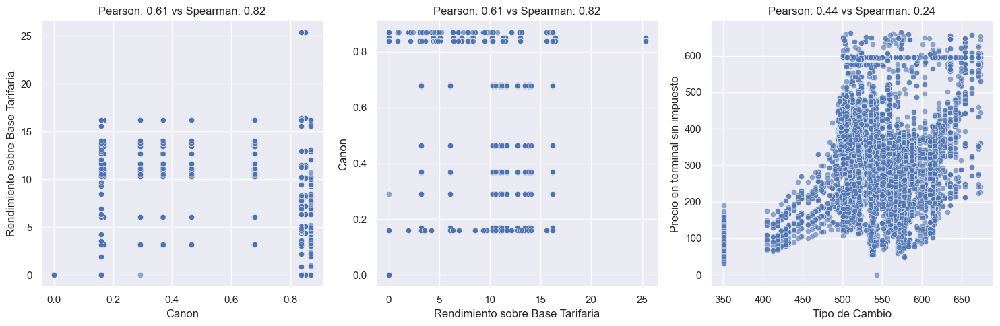


6. CLÚSTERES DE VARIABLES CORRELACIONADAS


C:\Users\larao\AppData\Local\Temp\ipykernel_6988\1871747067.py:213: ClusterWarning:

The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



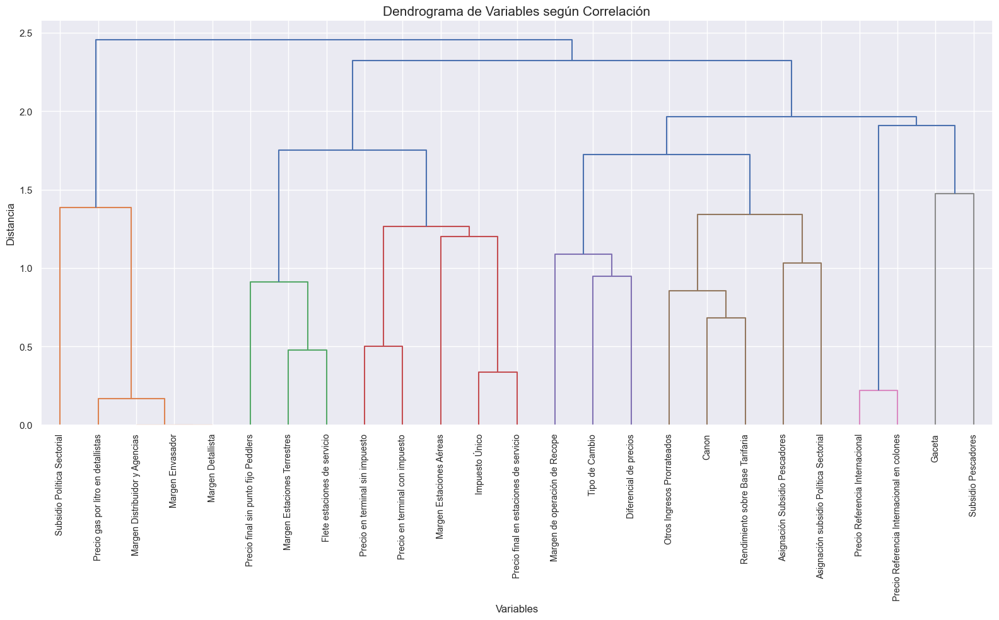


7. CONCLUSIONES DEL ANÁLISIS DE CORRELACIÓN

Variables altamente correlacionadas (|r| > 0.9):
                                     Variable 1  \
595                           Margen Detallista   
523                            Margen Envasador   
522                            Margen Envasador   
570              Margen Distribuidor y Agencias   
573              Margen Distribuidor y Agencias   
597                           Margen Detallista   
53              Precio Referencia Internacional   
77   Precio Referencia Internacional en colones   
599                           Margen Detallista   
623         Precio gas por litro en detallistas   
524                            Margen Envasador   
620         Precio gas por litro en detallistas   
574              Margen Distribuidor y Agencias   
622         Precio gas por litro en detallistas   
365             Precio en terminal sin impuesto   
389             Precio en terminal con impuesto   

                                     

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Usar el DataFrame original o el procesado según disponibilidad
# Preferimos usar un DataFrame sin normalizar para ver las correlaciones originales
df_corr = df_corregido.copy()

# Seleccionar solo columnas numéricas para el análisis de correlación
num_cols = df_corr.select_dtypes(include=['float64', 'int64', 'Int64']).columns.tolist()
print(f"Analizando correlaciones entre {len(num_cols)} variables numéricas")

# Verificar que haya suficientes columnas numéricas para analizar
if len(num_cols) < 2:
    print("No hay suficientes variables numéricas para realizar un análisis de correlación.")
else:
    # 1. Matriz de correlación de Pearson
    print("\n1. MATRIZ DE CORRELACIÓN DE PEARSON")
    print("Muestra correlaciones lineales entre variables (-1 a 1)")
    
    # Calcular la matriz de correlación
    corr_matrix = df_corr[num_cols].corr(method='pearson')
    
    # Mostrar la matriz de correlación
    print("\nMatriz de correlación:")
    print(corr_matrix.round(2))
    
    # Visualizar la matriz de correlación con seaborn
    plt.figure(figsize=(14, 12))
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Máscara para mostrar solo la mitad
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
                annot=True, fmt=".2f", square=True, linewidths=.5)
    plt.title('Matriz de Correlación de Pearson', fontsize=15)
    plt.tight_layout()
    plt.show()
    
    # 2. Identificar las correlaciones más fuertes
    print("\n2. CORRELACIONES MÁS FUERTES")
    
    # Convertir matriz de correlación a DataFrame para facilitar la manipulación
    corr_df = corr_matrix.stack().reset_index()
    corr_df.columns = ['Variable 1', 'Variable 2', 'Correlación']
    
    # Filtrar para eliminar autocorrelaciones y duplicados
    corr_df = corr_df[(corr_df['Variable 1'] != corr_df['Variable 2'])]
    
    # Ordenar por valor absoluto de correlación
    corr_df['Abs_Corr'] = corr_df['Correlación'].abs()
    corr_df = corr_df.sort_values('Abs_Corr', ascending=False)
    
    # Mostrar las 10 correlaciones más fuertes
    print("\nTop 10 correlaciones más fuertes:")
    print(corr_df.head(10))
    
    # Visualizar las 5 correlaciones más fuertes
    top_pairs = corr_df.head(5)
    
    plt.figure(figsize=(15, 12))
    for i, (_, row) in enumerate(top_pairs.iterrows()):
        var1, var2, corr_val = row['Variable 1'], row['Variable 2'], row['Correlación']
        
        plt.subplot(2, 3, i+1)
        sns.scatterplot(x=df_corr[var1], y=df_corr[var2], alpha=0.6)
        plt.title(f'Correlación: {corr_val:.2f}')
        plt.xlabel(var1)
        plt.ylabel(var2)
        
        # Añadir línea de regresión
        plt.plot(np.unique(df_corr[var1].dropna()), 
                np.poly1d(np.polyfit(df_corr[var1].dropna(), df_corr[var2].dropna(), 1))(np.unique(df_corr[var1].dropna())), 
                color='red')
    
    plt.tight_layout()
    plt.show()
    
    # 3. Análisis de correlación por grupos de variables
    print("\n3. ANÁLISIS DE CORRELACIÓN POR GRUPOS")
    
    # Si hay muchas variables numéricas, agruparlas en categorías lógicas
    if len(num_cols) > 10:
        # Ejemplo: podemos agrupar por prefijos comunes o características similares
        # Esto dependerá de los nombres de las columnas en el dataset específico
        
        # Algunas posibles agrupaciones:
        # - Variables relacionadas con precios
        # - Variables relacionadas con cantidades
        # - Variables relacionadas con fechas o tiempos
        # - Etc.
        
        # Para este ejemplo, agruparemos por el primer término del nombre de la columna
        grupos = {}
        
        for col in num_cols:
            # Dividir por guion bajo, punto o camel case
            prefix = col.split('_')[0].split('.')[0]
            # Convertir a minúsculas para estandarizar
            prefix = prefix.lower()
            
            if prefix not in grupos:
                grupos[prefix] = []
            grupos[prefix].append(col)
        
        print("\nAgrupaciones identificadas:")
        for grupo, columnas in grupos.items():
            if len(columnas) > 1:  # Solo mostrar grupos con más de una columna
                print(f"- Grupo '{grupo}': {len(columnas)} columnas")
                
                # Calcular correlaciones dentro del grupo
                if len(columnas) > 1:
                    group_corr = df_corr[columnas].corr()
                    
                    plt.figure(figsize=(10, 8))
                    sns.heatmap(group_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
                    plt.title(f'Correlaciones en grupo "{grupo}"')
                    plt.tight_layout()
                    plt.show()
    
    # 4. Mapa de calor interactivo con Plotly
    print("\n4. MAPA DE CALOR INTERACTIVO")
    
    # Limitar a 20 columnas para mantener el gráfico manejable
    if len(num_cols) > 20:
        # Tomar las columnas con mayor varianza
        cols_var = df_corr[num_cols].var().sort_values(ascending=False).head(20).index.tolist()
    else:
        cols_var = num_cols
    
    # Calcular matriz de correlación para las columnas seleccionadas
    fig = px.imshow(df_corr[cols_var].corr(),
                    labels=dict(x="Variable", y="Variable", color="Correlación"),
                    x=cols_var,
                    y=cols_var,
                    color_continuous_scale="RdBu_r",
                    title="Matriz de Correlación Interactiva")
    
    fig.update_layout(
        width=800,
        height=800,
        xaxis_showgrid=False,
        yaxis_showgrid=False,
        xaxis_tickangle=-45,
    )
    
    fig.show()
    
    # 5. Análisis de correlación Spearman (útil para relaciones no lineales)
    print("\n5. CORRELACIÓN DE SPEARMAN")
    print("Mide correlaciones monótonas, útil cuando la relación no es lineal")
    
    # Calcular matriz de correlación Spearman
    spearman_corr = df_corr[num_cols].corr(method='spearman')
    
    # Mostrar diferencias entre Pearson y Spearman
    print("\nComparación de diferencias significativas entre correlaciones Pearson y Spearman:")
    
    # Crear DataFrame para comparación
    comp_df = pd.DataFrame({
        'Pearson': corr_matrix.unstack(),
        'Spearman': spearman_corr.unstack()
    }).reset_index()
    comp_df.columns = ['Variable 1', 'Variable 2', 'Pearson', 'Spearman']
    
    # Filtrar autocorrelaciones
    comp_df = comp_df[comp_df['Variable 1'] != comp_df['Variable 2']]
    
    # Calcular diferencia absoluta
    comp_df['Diferencia'] = (comp_df['Spearman'] - comp_df['Pearson']).abs()
    
    # Mostrar las mayores diferencias (posibles relaciones no lineales)
    print(comp_df.sort_values('Diferencia', ascending=False).head(10))
    
    # Visualizar algunas de las relaciones con mayores diferencias
    top_diff = comp_df.sort_values('Diferencia', ascending=False).head(3)
    
    if not top_diff.empty:
        plt.figure(figsize=(15, 5))
        for i, (_, row) in enumerate(top_diff.iterrows()):
            var1, var2 = row['Variable 1'], row['Variable 2']
            pearson, spearman = row['Pearson'], row['Spearman']
            
            plt.subplot(1, 3, i+1)
            sns.scatterplot(x=df_corr[var1], y=df_corr[var2], alpha=0.6)
            plt.title(f'Pearson: {pearson:.2f} vs Spearman: {spearman:.2f}')
            plt.xlabel(var1)
            plt.ylabel(var2)
        
        plt.tight_layout()
        plt.show()
    
    # 6. Clústeres de variables correlacionadas
    print("\n6. CLÚSTERES DE VARIABLES CORRELACIONADAS")
    
    # Convertir la matriz de correlación en una matriz de distancias
    # Variables altamente correlacionadas tendrán distancias pequeñas
    dist = 1 - corr_matrix.abs()
    
    # Realizar clustering jerárquico
    from scipy.cluster import hierarchy
    
    try:
        plt.figure(figsize=(16, 10))
        # Asegurar que la matriz es simétrica antes de calcular el enlace
        # Usar un método alternativo para calcular el enlace evitando squareform
        if len(num_cols) > 1:  # Solo si hay más de una columna numérica
            # Convertir la matriz de distancia a un vector de condensed distance
            # Primero asegurémonos de que la matriz sea simétrica
            dist_sym = (dist + dist.T) / 2
            
            # Calcular el enlace directamente sin usar squareform
            linkage = hierarchy.linkage(dist_sym, method='complete')
            dendro = hierarchy.dendrogram(linkage, labels=corr_matrix.columns, leaf_rotation=90)
            plt.title('Dendrograma de Variables según Correlación', fontsize=15)
            plt.xlabel('Variables')
            plt.ylabel('Distancia')
            plt.tight_layout()
            plt.show()
        else:
            print("No hay suficientes variables numéricas para realizar clustering jerárquico.")
    except Exception as e:
        print(f"Error al realizar clustering jerárquico: {e}")
        print("Omitiendo visualización de dendrograma.")
    
    # 7. Conclusiones sobre correlaciones
    print("\n7. CONCLUSIONES DEL ANÁLISIS DE CORRELACIÓN")
    
    # Identificar variables altamente correlacionadas para posible eliminación
    threshold = 0.9  # Umbral de correlación muy alta
    high_corr = corr_df[corr_df['Abs_Corr'] > threshold]
    
    if not high_corr.empty:
        print(f"\nVariables altamente correlacionadas (|r| > {threshold}):")
        print(high_corr)
        print("\nEstas variables podrían ser redundantes. Se recomienda considerar eliminar una de cada par.")
    else:
        print(f"No se encontraron variables con correlaciones muy altas (|r| > {threshold}).")
    
    # Variables con correlaciones fuertes con múltiples variables
    var_count = pd.concat([
        corr_df[corr_df['Abs_Corr'] > 0.7]['Variable 1'],
        corr_df[corr_df['Abs_Corr'] > 0.7]['Variable 2']
    ]).value_counts()
    
    if not var_count.empty and len(var_count[var_count > 1]) > 0:
        print("\nVariables con múltiples correlaciones fuertes:")
        print(var_count[var_count > 1])
        print("\nEstas variables podrían ser especialmente importantes en el dataset.")
    
    # Resumen de hallazgos
    print("\nResumen de hallazgos del análisis de correlación:")
    if not corr_df.empty and len(corr_df) >= 3:
        print("1. Las correlaciones más fuertes se encuentran entre: " + 
              ", ".join([f"{row['Variable 1']} y {row['Variable 2']} ({row['Correlación']:.2f})" 
                        for _, row in corr_df.head(3).iterrows()]))
    
    # Verificar posibles relaciones no lineales
    if not comp_df.empty and comp_df['Diferencia'].max() > 0.2 and len(comp_df[comp_df['Diferencia'] > 0.2]) > 0:
        print("2. Se detectaron posibles relaciones no lineales entre: " + 
              ", ".join([f"{row['Variable 1']} y {row['Variable 2']}" 
                        for _, row in comp_df[comp_df['Diferencia'] > 0.2].head(3).iterrows()]))
    else:
        print("2. No se detectaron relaciones no lineales significativas.")
    
    # Guardar las correlaciones en un archivo
    corr_matrix.to_csv("resultados/matriz_correlacion.csv")
    print("\nMatriz de correlación guardada en 'resultados/matriz_correlacion.csv'")


## Exportación de resultados

In [ ]:
import os

# Crear directorio para resultados si no existe
if not os.path.exists("resultados"):
    os.makedirs("resultados")
    print("Directorio 'resultados' creado.")

# Exportar el DataFrame final para modelado
# Priorizar DataFrame con mayor procesamiento
if 'df_standard' in locals():
    print("\nExportando DataFrame estandarizado (df_standard):")
    # Usar directamente el DataFrame ya procesado
    df_modelo = df_standard.copy()
    modelo_origen = 'df_standard (estandarizado)'
elif 'df_minmax' in locals():
    print("\nExportando DataFrame normalizado (df_minmax):")
    df_modelo = df_minmax.copy()
    modelo_origen = 'df_minmax (normalizado)'
elif 'df_encoded' in locals():
    print("\nExportando DataFrame codificado (df_encoded):")
    df_modelo = df_encoded.copy()
    modelo_origen = 'df_encoded (con variables codificadas)'
elif 'df_corregido' in locals():
    print("\nExportando DataFrame limpio (df_corregido):")
    df_modelo = df_corregido.copy()
    modelo_origen = 'df_corregido (limpio)'
else:
    print("Error: No se encontró ningún DataFrame procesado.")
    modelo_origen = None

if modelo_origen:
    ruta_exportacion = "resultados/dataset_para_modelado.csv"
    df_modelo.to_csv(ruta_exportacion, index=False)
    
    print(f"Dataset para modelado guardado como '{ruta_exportacion}'")
    print(f"Origen: {modelo_origen}")
    print(f"Dimensiones: {df_modelo.shape[0]} filas × {df_modelo.shape[1]} columnas")
    
    # Mostrar todas las columnas para verificar
    print("\nColumnas en el dataset final:")
    for col in df_modelo.columns:
        print(f"- {col}")

print("\nEl análisis se ha completado exitosamente. El dataset está listo para modelado.")


Exportando DataFrame estandarizado (df_standard):
Dataset para modelado guardado como 'resultados/dataset_para_modelado.csv'
Origen: df_standard (estandarizado)
Dimensiones: 7353 filas × 33 columnas

Columnas en el dataset final:
- Fecha Publicación
- Alcance Gaceta
- Gaceta
- Producto
- Tipo de Cambio
- Precio Referencia Internacional
- Precio Referencia Internacional en colones
- Otros Ingresos Prorrateados
- Asignación Subsidio Pescadores
- Asignación subsidio Política Sectorial
- Subsidio Pescadores
- Subsidio Política Sectorial
- Diferencial de precios
- Impuesto Único
- Canon
- Margen de operación de Recope
- Rendimiento sobre Base Tarifaria
- Precio en terminal sin impuesto
- Precio en terminal con impuesto
- Precio final sin punto fijo Peddlers
- Margen Estaciones Terrestres
- Margen Estaciones Aéreas
- Flete estaciones de servicio
- Margen Envasador
- Precio final en estaciones de servicio
- Margen Distribuidor y Agencias
- Margen Detallista
- Precio gas por litro en detallis